# Imports

In [4]:
import numpy as np
from datetime import datetime
from Database.TPData import TPData, TPDataDa
from OrderBook.OrderBook import OrderBookSnaps
import pandas as pd

l_path = '//192.168.10.91/data/Data/orderbooks/base/'


def load_ob(m, t, dt, p_d, bT, eT):
    ob_class = OrderBookSnaps(verbose=True)
    file_path = l_path + t.split('_')[0] + '/'
    file_name = m + '_' + t.split('_')[0] + '_' + p_d.strftime('%y%m%d') + '_' + dt.strftime('%y%m%d') + '.p'
    print('%s Loading OrderBook %d...' % (dt.strftime('%y-%m-%d'), 0))
    time_load = ob_class.import_data(file_path + file_name)
    print('OrderBook %d created in %d sec' % (0, time_load))
    # ob_class.LoB_truncate(thres_vol=1)
    return ob_class.LoB_select(bT, eT, freq=None)


data_class = TPData()
data_class.create_connection('PostgreSQL')

mkt = 'de'
tenor = 'm'
prod = 'base'
venue_list = ['eex']
start_date1 = datetime(2024, 3, 1)
start_date2 = None
bT = datetime(2024, 1, 25, hour=9, minute=00, second=0)
eT = datetime(2024, 1, 25, hour=16, minute=25, second=0)

# df_ord_data = data_class.get_orders_data(mkt, tenor, venue_list, start_date1,
#                                           bT, eT, prod, start_date2)

ob_class = OrderBookSnaps(verbose=True)
# LoB_dict, err_dict = ob_class.construct_data(df_ord_data)

LoB_dict, time_list = load_ob(mkt, tenor, bT, start_date1, bT, eT)
ob_class.update_data(LoB_dict, time_list)



24-01-25 Loading OrderBook 0...
OrderBook 0 created in 13 sec


In [268]:
data_class.create_connection('OracleSQL')
df_tr_aux = data_class.get_trades(mkt, tenor, venue_list, start_date1, bT, eT, prod)

Connected to the database oracle
Disconnected from the database oracle


# Functions

In [102]:
def density_func(order_book, p_target=.5):
    def omega(x, y, range_):
        return np.exp(-(abs(x-y)/p_target))
    
    _MIN_N_ORDERS = 5
    diff = pd.Series(order_book).diff(1).shift(-1).dropna()
    length = len(diff)
    if length < _MIN_N_ORDERS:
        return 0.0
    
    sum_w_diff = []
    manual_kernel = sum([[3, 2, 1.5, 1], [omega(order_book[0], order_book[i], p_target)
                                     for i in range(4, len(order_book))]], [])
    kernel_list =  pd.Series(manual_kernel)/sum(manual_kernel)
#     print('kernel',pd.Series(kernel_list))

    for i in range(length):
        sum_w_diff.append(kernel_list[i]*(abs(diff[i])))
#     print('gaps',pd.Series(sum_w_diff))
    return round(sum(sum_w_diff),2)
    return round(sum(sum_w_diff)/(p_target/(order_book[-1]-order_book[0])),2)

def volume_resist(order_book, volume):
    return abs(order_book[0]-(order_book[volume]))

def ba_ratio(asks, bids, delta_price):
    a_volume = sum(pd.Series(asks)<(asks[0]+ delta_price))
    b_volume = sum(pd.Series(bids)>(bids[0]-delta_price))
    return (b_volume-a_volume)/max(a_volume, b_volume)
    
def ob_price_kernel(c=0.2):
    # price is absolute value of distance from best order
    # c := constant, dead zone, the value will decay after this value
    # https://www.desmos.com/calculator/sa2bhazbp3
    a = -np.log(0.5) / c
    return lambda price: float(np.where(price<=c, 1, np.exp(-(a*price-a*c))))

def weighted_linearfit(orders, kernel=ob_price_kernel()):
    p_0 = orders[0]
    y_data = [abs(x-p_0) for x in orders][1:]
    x_data = np.arange(1, len(y_data)+1)
    weights = [kernel(x) for x in y_data]
    # Calculate the weighted sum of x*y and x^2
    numerator = np.sum(weights * x_data * y_data)
    denominator = np.sum(weights * x_data**2)

    # Calculate the slope
    slope = numerator / denominator

    return slope

class DirectionalOperator():
    def __init__(self, p_movement):
        self.p_movement = p_movement
        self.value = 0.0
    
    def update(self, price_diff):
        self.value += price_diff
        if self.value > self.p_movement:
            self.value = self.p_movement + price_diff/2
        elif self.value < -self.p_movement:
            self.value = -self.p_movement - price_diff/2
    
    def evaluate(self):
        # https://www.desmos.com/calculator/cc7kcid1jk
        f = lambda x, b: (lambda y: 1 if y > 1 else y)((1/b**2)*x**2) if x > 0 else (lambda y: -1 if y < -1 else y)(-(1/b**2)*x**2)
        return f(self.value, self.p_movement)
    
def calc_returns(lob, index, minutes):
    ts_end = pd.Timestamp(lob[index].time_snapshot) + pd.Timedelta(minutes, "m")
    curr_a = lob[index].asks[0].price
    curr_b = lob[index].bids[0].price
    best_long = None
    best_short = None
    
    i = index
    while lob[i].time_snapshot < ts_end:
        i += 1
        if not lob.get(i+1, None):
            break
        future_a = lob[i].asks[0].price
        future_b = lob[i].bids[0].price
        curr_long = future_b - curr_a
        curr_short = curr_b - future_a

        if not best_long:
            best_long = curr_long
        if not best_short:
            best_short = curr_short
            
        if curr_long > best_long:
            best_long = curr_long
        if curr_short > best_short:
            best_short = curr_short
    try:
        # print(best_long, best_short)
        if max(best_long, best_short) < 0:
            return 0.0
        return best_long if best_long > best_short else -best_short
    except:
        return 0.0

In [117]:
print(density_func([25.05, 25.1, 25.15, 25.2, 25.25, 25.3]))
print(density_func(np.arange(25.05, 25.3, 0.01)))
print(density_func([25.05, 25.4, 25.7, 25.75, 25.80, 25.85, 25.90]))
print(density_func([43.0, 43.1, 43.19, 43.20, 43.5, 43.67, 43.73]))
print(density_func([43.0, 43.05, 43.50, 43.85, 43.9, 45]))

0.05
0.01
0.22
0.1
0.24


In [116]:
0.5/(5/(0.5/.01))

5.0

# Data prep

In [269]:
mids = []
asks_slope = []
bids_slope = []
b_bid = []
b_ask = []
ratio = []

    
for row in [*LoB_dict.values()]:
    asks = sum([[x.price]*x.volume for x in row.asks], [])
    bids = sum([[x.price]*x.volume for x in row.bids], [])
    asks_slope.append(weighted_linearfit(asks))
    bids_slope.append(weighted_linearfit(bids))
    b_bid.append(bids[0])
    b_ask.append(asks[0])
    ratio.append(ba_ratio(asks, bids, .5))
    mids.append((bids[0]+asks[0])/2)

In [270]:
df = pd.DataFrame({
    'bids_slope': bids_slope,
    'asks_slope': asks_slope,
    'b_bid': b_bid,
    'b_ask': b_ask,
    'ratio': ratio
}, index=time_list)

In [14]:
import seaborn as sns

<Axes: xlabel='ratio', ylabel='returns'>

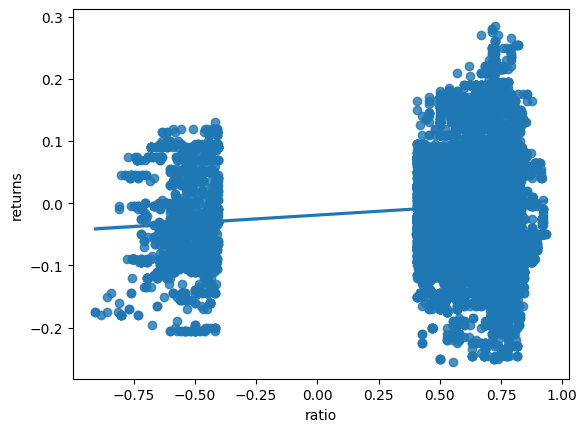

In [119]:
sns.regplot(df[abs(df['ratio'])>.4], x='ratio', y='returns')

In [271]:
l_get_trades_5minutes = lambda ts: df_tr_aux[(df_tr_aux.index > ts) & (df_tr_aux.index <= ts + pd.Timedelta(minutes=5))]
l_get_trades_5minutes(time_list[0])['price'].diff(1).sum()
indices = [l_get_trades_5minutes(ts)['price'].min() for ts in time_list]
df['min'] = indices
indices = [l_get_trades_5minutes(ts)['price'].max() for ts in time_list]
df['max'] = indices
df['returns'] = ((df['max']+df['min'])/2) - ((df['b_bid']+df['b_ask'])/2)

In [214]:
idx = df.groupby(df.index.floor('T'))['slope_diff'].apply(lambda x: x.abs().idxmax())

# Use the index to select the rows with the max slope_diff within each minute interval
df.loc[idx].to_csv('ob_sparsity_sample.csv', sep=';')

In [126]:
df_filtered = df.loc[idx]

In [161]:
df.describe()

,asks_slope,bids_slope,b_bid,b_ask,ratio,slope_diff,min,max,returns
count,33737.000000,33737.000000,33737.000000,33737.000000,33737.000000,33737.000000,33677.000000,33677.000000,33677.000000
mean,0.018127,0.020904,58.061564,58.157924,-0.147382,0.002777,58.041375,58.163084,-0.007701
std,0.006930,0.006699,0.296293,0.296342,0.365054,0.010132,0.290952,0.310779,0.078157
min,0.005332,0.006519,57.480000,57.510000,-0.926829,-0.035291,57.470000,57.540000,-0.255000
25%,0.012755,0.016144,57.850000,57.950000,-0.418605,-0.003611,57.850000,57.950000,-0.065000
50%,0.017782,0.019953,58.050000,58.160000,-0.222222,0.003509,58.050000,58.150000,-0.005000
75%,0.022515,0.024831,58.290000,58.400000,0.074074,0.009573,58.250000,58.400000,0.050000
max,0.048733,0.056877,58.750000,58.840000,0.885714,0.035158,58.650000,58.760000,0.285000


<Axes: xlabel='asks_slope', ylabel='returns'>

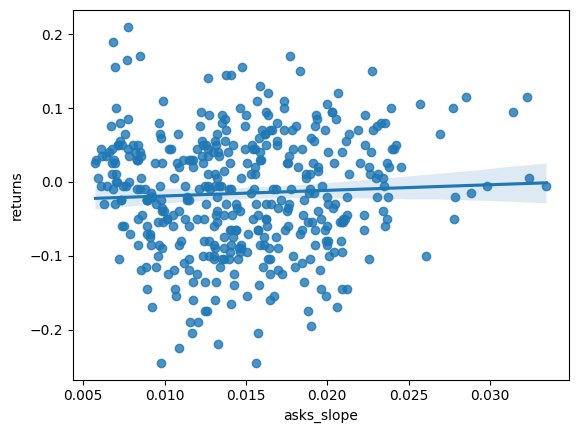

In [144]:
sns.regplot(df_filtered[abs(df_filtered) > .0], x='asks_slope', y='returns')

In [165]:
from Math.accumfeatures import MSTD, MA, EMA

In [119]:
import plotly.express as px
# Allows us to create graph objects for making more customized plots
import plotly.graph_objects as go

# Use included Google price data to make one plot
df_stocks = px.data.stocks()
px.line(df_stocks, x='date', y='GOOG', labels={'x':'Date', 'y':'Price'})

# Make multiple line plots
px.line(df_stocks, x='date', y=['GOOG','AAPL'], labels={'x':'Date', 'y':'Price'},
       title='Apple Vs. Google')

# Create a figure to which I'll add plots
fig = go.Figure()
# You can pull individual columns of data from the dataset and use markers or not
fig.add_trace(go.Scatter(x=df_stocks.date, y=df_stocks.AAPL, 
                        mode='lines', name='Apple'))
fig.add_trace(go.Scatter(x=df_stocks.date, y=df_stocks.AMZN, 
                        mode='lines+markers', name='Amazon'))
# You can create custom lines (Dashes : dash, dot, dashdot)
fig.add_trace(go.Scatter(x=df_stocks.date, y=df_stocks.GOOG, 
                        mode='lines+markers', name='Google',
                        line=dict(color='firebrick', width=2, dash='dashdot')))
# Further style the figure
# fig.update_layout(title='Stock Price Data 2018 - 2020',
#                    xaxis_title='Price', yaxis_title='Date')

# Go crazy styling the figure
fig.update_layout(
    # Shows gray line without grid, styling fonts, linewidths and more
    xaxis=dict(
        showline=True,
        showgrid=False,
        showticklabels=True,
        linecolor='rgb(204, 204, 204)',
        linewidth=2,
        ticks='outside',
        tickfont=dict(
            family='Arial',
            size=12,
            color='rgb(82, 82, 82)',
        ),
    ),
    # Turn off everything on y axis
    yaxis=dict(
        showgrid=False,
        zeroline=False,
        showline=False,
        showticklabels=False,
    ),
    autosize=False,
    margin=dict(
        autoexpand=False,
        l=100,
        r=20,
        t=110,
    ),
    showlegend=False,
    plot_bgcolor='white'
)

In [206]:
bid_ema = MSTD(10, 10)
ask_ema = MSTD(10, 10)

In [207]:
bid_target = []
bid_std = []
ask_target = []
ask_std = []

for bid, ask in zip(df_filtered['b_bid'], df_filtered['b_ask']):
    bid_ema.push(bid)
    ask_ema.push(ask)
    bid_target.append(bid_ema.mean.value)
    bid_std.append(bid_ema.value)
    ask_target.append(ask_ema.mean.value)
    ask_std.append(ask_ema.value)

In [208]:
targets = pd.DataFrame({
    'bid_target': bid_target,
    'bid_std': bid_std,
    'ask_target': ask_target,
    'ask_std': ask_std
})

In [212]:
import plotly.graph_objects as go

fig = go.Figure()
fig.add_traces([
    go.Scatter(x=targets['index'], y=targets['bid_target']),
    go.Scatter(x=targets['index'], y=targets['ask_target']),
    go.Scatter(x=targets['index'], y=targets['b_bid']),
    go.Scatter(x=targets['index'], y=targets['b_ask'])
])
fig.show()

C:\develop\EnergyTrading\env\Lib\site-packages\_plotly_utils\basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



In [210]:
targets = pd.concat([targets, df_filtered.reset_index()], axis=1)

In [211]:
targets

,bid_target,bid_std,ask_target,ask_std,index,asks_slope,bids_slope,b_bid,b_ask,ratio,returns,slope_diff,max,min
0,7.593777,18.322625,7.615878,18.375952,2024-02-14 08:59:55.846,0.010592,0.021486,58.41,58.58,0.578947,0.005,0.010894,58.60,58.40
1,10.815380,20.913904,10.836430,20.954104,2024-02-14 09:00:08.069,0.009753,0.034312,58.48,58.57,0.875000,-0.025,0.024559,58.60,58.40
2,14.032741,22.889272,14.057441,22.929196,2024-02-14 09:01:57.182,0.008607,0.032638,58.49,58.57,0.500000,-0.045,0.024031,58.60,58.37
3,17.253288,24.435708,17.278483,24.471003,2024-02-14 09:02:30.319,0.008953,0.041575,58.53,58.58,0.200000,-0.070,0.032622,58.60,58.37
4,20.449866,25.618483,20.493398,25.673488,2024-02-14 09:03:05.206,0.008391,0.023543,58.40,58.57,0.923077,-0.050,0.015152,58.50,58.37
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
439,57.553099,0.076189,57.611923,0.102042,2024-02-14 16:20:52.329,0.029810,0.020832,57.56,57.62,-0.193548,-0.005,-0.008978,57.60,57.57
440,57.551754,0.073255,57.611236,0.098534,2024-02-14 16:21:46.273,0.023043,0.021398,57.57,57.64,0.192308,-0.020,-0.001645,57.60,57.57
441,57.541145,0.071321,57.609893,0.094569,2024-02-14 16:22:12.700,0.021981,0.018550,57.50,57.64,0.322581,0.025,-0.003431,57.60,57.59
442,57.537678,0.067752,57.613269,0.092003,2024-02-14 16:23:43.538,0.021558,0.017248,57.51,57.67,0.090909,0.000,-0.004310,57.59,57.59


# Interday stats

## 14.2

In [217]:
df.describe() # 14.2

,asks_slope,bids_slope,b_bid,b_ask,ratio,slope_diff,min,max,returns
count,33737.000000,33737.000000,33737.000000,33737.000000,33737.000000,33737.000000,33677.000000,33677.000000,33677.000000
mean,0.018127,0.020904,58.061564,58.157924,-0.147382,0.002777,58.041375,58.163084,-0.007701
std,0.006930,0.006699,0.296293,0.296342,0.365054,0.010132,0.290952,0.310779,0.078157
min,0.005332,0.006519,57.480000,57.510000,-0.926829,-0.035291,57.470000,57.540000,-0.255000
25%,0.012755,0.016144,57.850000,57.950000,-0.418605,-0.003611,57.850000,57.950000,-0.065000
50%,0.017782,0.019953,58.050000,58.160000,-0.222222,0.003509,58.050000,58.150000,-0.005000
75%,0.022515,0.024831,58.290000,58.400000,0.074074,0.009573,58.250000,58.400000,0.050000
max,0.048733,0.056877,58.750000,58.840000,0.885714,0.035158,58.650000,58.760000,0.285000


## 7.2

In [229]:
df.describe()

,bids_slope,asks_slope,b_bid,b_ask,ratio,min,max,returns
count,30846.000000,30846.000000,30846.000000,30846.000000,30846.000000,30299.000000,30299.000000,30299.000000
mean,0.020396,0.019436,67.797835,67.924124,-0.057141,67.789247,67.929239,-0.004039
std,0.006985,0.007424,0.445113,0.442976,0.432675,0.468951,0.446633,0.091870
min,0.004572,0.006772,66.750000,66.780000,-0.923077,66.780000,66.850000,-0.575000
25%,0.015330,0.013092,67.520000,67.670000,-0.419355,67.500000,67.650000,-0.060000
50%,0.019234,0.018822,67.700000,67.840000,-0.157895,67.700000,67.850000,0.000000
75%,0.024501,0.025082,68.160000,68.280000,0.320000,68.150000,68.300000,0.055000
max,0.059943,0.048234,68.660000,68.700000,0.961538,68.600000,68.660000,0.285000


## 8.2

In [236]:
df.describe()

,bids_slope,asks_slope,b_bid,b_ask,ratio,min,max,returns
count,33304.000000,33304.000000,33304.000000,33304.000000,33304.000000,32586.000000,32586.000000,32586.000000
mean,0.014524,0.018058,65.958475,66.082850,0.164710,65.957723,66.073789,-0.006741
std,0.005226,0.005189,0.491436,0.504301,0.345032,0.511676,0.501256,0.078459
min,0.004687,0.004695,65.250000,65.280000,-0.923077,65.250000,65.300000,-0.310000
25%,0.010800,0.015076,65.560000,65.660000,-0.090909,65.510000,65.660000,-0.060000
50%,0.013329,0.018035,65.800000,65.940000,0.209302,65.800000,65.860000,-0.010000
75%,0.018198,0.021364,66.320000,66.460000,0.406250,66.360000,66.500000,0.050000
max,0.035806,0.055960,67.100000,67.200000,0.907407,67.150000,67.150000,0.215000


## 9.2

In [244]:
df.describe()

,bids_slope,asks_slope,b_bid,b_ask,ratio,min,max,returns
count,34306.000000,34306.000000,34306.000000,34306.000000,34306.000000,33754.000000,33754.000000,33754.000000
mean,0.018870,0.018628,63.087801,63.190407,0.065862,63.065012,63.274723,0.025576
std,0.005360,0.005247,0.364863,0.367951,0.355189,0.362639,0.534957,0.248927
min,0.008828,0.007953,62.400000,62.450000,-0.800000,62.450000,62.530000,-0.325000
25%,0.015348,0.014717,62.750000,62.840000,-0.206897,62.710000,62.860000,-0.060000
50%,0.017915,0.017542,63.150000,63.260000,0.055556,63.100000,63.300000,0.000000
75%,0.021117,0.021277,63.360000,63.470000,0.333333,63.330000,63.500000,0.045000
max,0.053246,0.043794,63.940000,64.000000,0.883721,63.800000,65.600000,1.465000


## 12.2

In [253]:
df.describe()

,bids_slope,asks_slope,b_bid,b_ask,ratio,min,max,returns
count,39026.000000,39026.000000,39026.000000,39026.000000,39026.000000,37744.000000,37744.000000,37744.000000
mean,0.012353,0.017795,60.560444,60.664848,0.297910,60.534176,60.685966,-0.000954
std,0.003940,0.006109,0.212854,0.223593,0.289785,0.303038,0.221783,0.137020
min,0.005192,0.005130,60.160000,60.180000,-0.800000,57.500000,60.210000,-1.620000
25%,0.009295,0.013526,60.380000,60.480000,0.157895,60.350000,60.500000,-0.045000
50%,0.011693,0.016815,60.550000,60.660000,0.372093,60.550000,60.700000,0.000000
75%,0.014823,0.020843,60.750000,60.850000,0.500000,60.750000,60.860000,0.055000
max,0.030861,0.052590,61.210000,61.250000,0.925373,61.140000,61.200000,0.420000


## 13.2

In [259]:
df.describe()

,bids_slope,asks_slope,b_bid,b_ask,ratio,min,max,returns
count,38697.000000,38697.000000,38697.000000,38697.000000,38697.000000,38629.000000,38629.000000,38629.000000
mean,0.018244,0.021355,60.140630,60.230731,0.088570,60.098184,60.252862,-0.010588
std,0.007219,0.007675,0.633855,0.638654,0.362414,0.645829,0.618353,0.102245
min,0.006629,0.002847,58.700000,58.790000,-0.876923,58.750000,58.850000,-0.330000
25%,0.012763,0.016481,59.810000,59.900000,-0.179487,59.500000,59.920000,-0.060000
50%,0.016706,0.020518,60.260000,60.350000,0.150000,60.220000,60.350000,-0.010000
75%,0.022617,0.025376,60.650000,60.760000,0.361702,60.640000,60.750000,0.035000
max,0.056168,0.056821,61.250000,61.390000,0.888889,61.200000,61.290000,0.470000


## 24.1

In [266]:
df.describe()

,bids_slope,asks_slope,b_bid,b_ask,ratio,min,max,returns
count,32563.000000,32563.000000,32563.000000,32563.000000,32563.000000,30499.000000,30499.000000,30499.00000
mean,0.024722,0.026748,64.457267,64.645624,0.061059,64.503912,64.652679,0.01645
std,0.009982,0.009590,0.709510,0.706452,0.316923,0.700511,0.752268,0.12061
min,0.008742,0.007582,62.520000,63.500000,-0.909091,63.500000,63.550000,-0.32000
25%,0.018515,0.019901,63.860000,64.030000,-0.157895,63.900000,64.000000,-0.07000
50%,0.022676,0.025526,64.290000,64.540000,0.052632,64.350000,64.450000,0.01500
75%,0.027970,0.032065,65.050000,65.190000,0.294118,65.050000,65.250000,0.08500
max,0.104427,0.100155,65.990000,66.300000,0.846154,66.150000,66.200000,0.58000


## 25.1

In [272]:
df.describe()

,bids_slope,asks_slope,b_bid,b_ask,ratio,min,max,returns
count,36383.000000,36383.000000,36383.000000,36383.000000,36383.000000,35049.000000,35049.000000,35049.000000
mean,0.031723,0.033880,64.323512,64.483385,0.058394,64.291974,64.446706,-0.031981
std,0.011150,0.012609,1.339933,1.397944,0.392926,1.336579,1.372584,0.123947
min,0.005067,0.006068,62.700000,62.800000,-0.904762,62.800000,62.870000,-0.715000
25%,0.024114,0.025770,63.050000,63.180000,-0.217391,63.050000,63.200000,-0.095000
50%,0.029425,0.031249,63.860000,63.970000,0.083333,63.890000,63.940000,-0.020000
75%,0.037601,0.039106,65.350000,65.660000,0.375000,65.500000,65.590000,0.050000
max,0.119585,0.127613,67.260000,67.700000,0.894737,67.380000,67.500000,0.360000


# Aggregate data

## Trade returns

In [351]:
df_result = pd.DataFrame()
# dates = [(1,24,2), (1,25,2), (1,26,2), (1,29,3), (1,30,3), (2,12,3), (2,13,3), (2,14,3), (2,15,3), (2,16,3)]
dates = [(2,12,3), (2,13,3), (2,14,3), (2,15,3), (2,16,3)]
for m_, d_, p_ in dates:
    data_class = TPData()
    data_class.create_connection('PostgreSQL')

    mkt = 'de'
    tenor = 'm'
    prod = 'base'
    venue_list = ['eex']
    start_date1 = datetime(2024, p_, 1)
    start_date2 = None
    bT = datetime(2024, m_, d_, hour=9, minute=00, second=0)
    eT = datetime(2024, m_, d_, hour=16, minute=25, second=0)

    # df_ord_data = data_class.get_orders_data(mkt, tenor, venue_list, start_date1,
    #                                           bT, eT, prod, start_date2)

    ob_class = OrderBookSnaps(verbose=True)
    # LoB_dict, err_dict = ob_class.construct_data(df_ord_data)

    LoB_dict, time_list = load_ob(mkt, tenor, bT, start_date1, bT, eT)
    ob_class.update_data(LoB_dict, time_list)

    data_class.create_connection('OracleSQL')
    df_tr_aux = data_class.get_trades(mkt, tenor, venue_list, start_date1, bT, eT, prod)

    mids = []
    asks_slope = []
    bids_slope = []
    b_bid = []
    b_ask = []
    ratio = []
    dir_operator = []
    op = DirectionalOperator(0.3)
    index = 0 # for timestamp access
    last_trade_ts = pd.Timestamp('2022-01-01')
    last_trade_index = 0

    for row in [*LoB_dict.values()]:
        asks = sum([[x.price]*x.volume for x in row.asks], [])
        bids = sum([[x.price]*x.volume for x in row.bids], [])
        asks_slope.append(weighted_linearfit(asks))
        bids_slope.append(weighted_linearfit(bids))
        b_bid.append(bids[0])
        b_ask.append(asks[0])
        ratio.append(ba_ratio(asks, bids, .5))
        mids.append((bids[0]+asks[0])/2)
        curr_ts = time_list[index]
        
        if (((last_trade_index+1) < len(df_tr_aux)) 
            and (curr_ts >= df_tr_aux.index[last_trade_index+1])):
            op.update(df_tr_aux['price'][last_trade_index+1]-df_tr_aux['price'][last_trade_index])
            last_trade_index += 1
        
        dir_operator.append(op.evaluate())
        
        index += 1
    

    df = pd.DataFrame({
        'bids_slope': bids_slope,
        'asks_slope': asks_slope,
        'b_bid': b_bid,
        'b_ask': b_ask,
        'ratio': ratio,
        'dir_operator': dir_operator
    }, index=time_list)

    l_get_trades_5minutes = lambda ts: df_tr_aux[(df_tr_aux.index > ts) & (df_tr_aux.index <= ts + pd.Timedelta(minutes=5))]
    l_get_trades_5minutes(time_list[0])['price'].diff(1).sum()
    indices = [l_get_trades_5minutes(ts)['price'].min() for ts in time_list]
    df['min'] = indices
    indices = [l_get_trades_5minutes(ts)['price'].max() for ts in time_list]
    df['max'] = indices
    df['returns'] = ((df['max']+df['min'])/2) - ((df['b_bid']+df['b_ask'])/2)
    
    if df_result.empty:
        df_result = df
    else:
        df_result = pd.concat([df_result, df])

24-02-12 Loading OrderBook 0...
OrderBook 0 created in 29 sec
Connected to the database oracle
Disconnected from the database oracle


C:\Users\scasny\AppData\Local\Temp\ipykernel_28108\306596724.py:54: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`



24-02-13 Loading OrderBook 0...
OrderBook 0 created in 24 sec
Connected to the database oracle
Disconnected from the database oracle


C:\Users\scasny\AppData\Local\Temp\ipykernel_28108\306596724.py:54: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`



24-02-14 Loading OrderBook 0...
OrderBook 0 created in 18 sec
Connected to the database oracle
Disconnected from the database oracle


C:\Users\scasny\AppData\Local\Temp\ipykernel_28108\306596724.py:54: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`



24-02-15 Loading OrderBook 0...
OrderBook 0 created in 29 sec
Connected to the database oracle
Disconnected from the database oracle


C:\Users\scasny\AppData\Local\Temp\ipykernel_28108\306596724.py:54: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`



24-02-16 Loading OrderBook 0...
OrderBook 0 created in 41 sec
Connected to the database oracle
Disconnected from the database oracle


C:\Users\scasny\AppData\Local\Temp\ipykernel_28108\306596724.py:54: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`



## Agg best orders returns

In [575]:
df_result = pd.DataFrame()
RETURNS_TIME_WINDOW_ = 1
# dates = [(1,24,2), (1,25,2), (1,26,2), (1,29,3), (1,30,3), (2,12,3), (2,13,3), (2,14,3), (2,15,3), (2,16,3)]
dates = [(2,12,3), (2,13,3), (2,14,3), (2,15,3), (2,16,3)]
for m_, d_, p_ in dates:
    data_class = TPData()
    data_class.create_connection('PostgreSQL')

    mkt = 'de'
    tenor = 'm'
    prod = 'base'
    venue_list = ['eex']
    start_date1 = datetime(2024, p_, 1)
    start_date2 = None
    bT = datetime(2024, m_, d_, hour=9, minute=0, second=0)
    eT = datetime(2024, m_, d_, hour=16, minute=25, second=0)

    # df_ord_data = data_class.get_orders_data(mkt, tenor, venue_list, start_date1,
    #                                           bT, eT, prod, start_date2)

    ob_class = OrderBookSnaps(verbose=True)
    # LoB_dict, err_dict = ob_class.construct_data(df_ord_data)

    LoB_dict, time_list = load_ob(mkt, tenor, bT, start_date1, bT, eT)
    ob_class.update_data(LoB_dict, time_list)

    data_class.create_connection('OracleSQL')
    df_tr_aux = data_class.get_trades(mkt, tenor, venue_list, start_date1, bT, eT, prod)

    asks_slope = []
    bids_slope = []
    b_bid = []
    b_ask = []
    ratio = []
    dir_operator = []
    spread = []
    returns = []
    op = DirectionalOperator(0.3)
    index = 0 # for timestamp access
    last_trade_ts = pd.Timestamp('2022-01-01')
    last_mid = None

    for row in [*LoB_dict.values()]:
        asks = sum([[x.price]*x.volume for x in row.asks], [])
        bids = sum([[x.price]*x.volume for x in row.bids], [])
        asks_slope.append(weighted_linearfit(asks))
        bids_slope.append(weighted_linearfit(bids))
        b_bid.append(bids[0])
        b_ask.append(asks[0])
        spread.append(asks[0] - bids[0])
        ratio.append(ba_ratio(asks, bids, .5))
        mid = (bids[0]+asks[0])/2
        curr_ts = time_list[index]
        if not last_mid: 
            op.update(0)
        else:
            op.update(mid-last_mid)
        last_mid = mid
        returns.append(calc_returns(LoB_dict, index, RETURNS_TIME_WINDOW_))
        dir_operator.append(op.evaluate())
        index += 1

    df = pd.DataFrame({
        'bids_slope': bids_slope,
        'asks_slope': asks_slope,
        'b_bid': b_bid,
        'b_ask': b_ask,
        'spread': spread,
        'ratio': ratio,
        'dir_operator': dir_operator,
        'returns': returns
    }, index=time_list)
    
    if df_result.empty:
        df_result = df
    else:
        df_result = pd.concat([df_result, df])

24-02-12 Loading OrderBook 0...
OrderBook 0 created in 28 sec
Connected to the database oracle
Disconnected from the database oracle
24-02-13 Loading OrderBook 0...
OrderBook 0 created in 26 sec
Connected to the database oracle
Disconnected from the database oracle
24-02-14 Loading OrderBook 0...
OrderBook 0 created in 22 sec
Connected to the database oracle
Disconnected from the database oracle
24-02-15 Loading OrderBook 0...
OrderBook 0 created in 31 sec
Connected to the database oracle
Disconnected from the database oracle
24-02-16 Loading OrderBook 0...
OrderBook 0 created in 50 sec
Connected to the database oracle
Disconnected from the database oracle


In [569]:
df_result

,bids_slope,asks_slope,b_bid,b_ask,spread,ratio,dir_operator,returns
2024-01-24 08:59:58.617,0.044694,0.098063,68.87,69.21,0.34,0.666667,-0.000000,0.0
2024-01-24 09:00:00.000,0.037432,0.063779,68.87,69.21,0.34,0.666667,-0.000000,0.0
2024-01-24 09:00:06.712,0.030536,0.063779,68.87,69.21,0.34,0.777778,-0.000000,0.0
2024-01-24 09:00:06.954,0.030577,0.060595,68.87,69.24,0.37,0.444444,0.002500,0.0
2024-01-24 09:00:16.354,0.030577,0.042657,68.87,69.20,0.33,0.722222,-0.000278,0.0
...,...,...,...,...,...,...,...,...
2024-01-30 16:24:41.011,0.065718,0.010278,66.06,66.29,0.23,-0.687500,0.040000,0.0
2024-01-30 16:24:41.049,0.065696,0.010278,66.06,66.29,0.23,-0.687500,0.040000,0.0
2024-01-30 16:24:41.557,0.065696,0.010779,66.06,66.29,0.23,-0.677419,0.040000,0.0
2024-01-30 16:24:44.600,0.065696,0.009813,66.06,66.29,0.23,-0.696970,0.040000,0.0


In [576]:
import pickle
with open('ob_sps_test.pkl', 'wb') as f:
    pickle.dump(df_result, f)
df_result.to_csv('ob_sparsity_test1m.csv', sep=';')

In [285]:
idx = df_result.groupby(df_result.index.floor('10T'))['slope_diff'].apply(lambda x: x.abs().idxmax())

# Use the index to select the rows with the max slope_diff within each minute interval
df_result.loc[idx].to_csv('ob_sparsity_10min_idxmax.csv', sep=';')

In [482]:
df_result

,bids_slope,asks_slope,b_bid,b_ask,ratio,dir_operator,min,max,returns,y
2024-02-12 08:59:57.645,0.014560,0.011614,60.60,60.75,-0.147059,-0.000000,60.75,60.85,0.125,0
2024-02-12 09:00:00.000,0.013821,0.011946,60.60,60.75,-0.147059,-0.000000,60.75,60.85,0.125,0
2024-02-12 09:00:01.815,0.013821,0.011946,60.60,60.75,-0.147059,-0.000000,60.75,60.85,0.125,0
2024-02-12 09:00:01.880,0.012106,0.011946,60.60,60.75,0.000000,-0.000000,60.75,60.85,0.125,0
2024-02-12 09:00:02.042,0.013884,0.011469,60.60,60.75,-0.171429,-0.000000,60.75,60.85,0.125,0
...,...,...,...,...,...,...,...,...,...,...
2024-02-16 16:24:55.667,0.020875,0.017119,56.07,56.18,-0.321429,-0.046944,NaN,NaN,NaN,0
2024-02-16 16:24:55.855,0.020693,0.017119,56.07,56.18,-0.321429,-0.046944,NaN,NaN,NaN,0
2024-02-16 16:24:57.477,0.020693,0.019143,56.07,56.18,-0.269231,-0.046944,NaN,NaN,NaN,0
2024-02-16 16:24:57.540,0.020693,0.020112,56.07,56.18,-0.240000,-0.046944,NaN,NaN,NaN,0


## TP DA orders

In [ ]:
mkt_list = ['de']    
tenor_list = ['m']
tn1_list = [1]
tn2_list = []
prod = 'base'
venue_list = ['eex']
start_date = datetime(2023, 11, 2, 16, 23)
end_date = datetime(2023, 11, 2, 16, 24)
n_s = 2
start_date1 = datetime(2023,12,1)
start_date2 = datetime(2024,3,1)
start_date2 = None

data_class = TPDataDa()


# Correlation analysis

In [286]:
def mastd(series, window):
    moving_avg = series.rolling(window=window).mean()
    moving_std = series.rolling(window=window).std()
    return pd.DataFrame({
        'ma': moving_avg.fillna(method='bfill'), 
        'mstd': moving_std.fillna(method='bfill')
    })

# https://www.desmos.com/calculator/xvlcfvr9pv
kernel = lambda x: (lambda xx: (np.e-1)**xx-1.3 if (np.e-1)**xx-1.3 > 0 else 0)(x) if x > 0 else 0

def cond_corr(condition, effect, window=10):
    # condition = A
    # effect = c
    mastd_cond = mastd(condition, window)
    mastd_eff = mastd(effect, window)
    cond_norm_variance = (mastd_cond['ma'] - condition) / mastd_cond['mstd']
    # eff_norm_variance = abs(mastd_eff['ma'] - effect) / mastd_eff['mstd']
    kernel_coefs = pd.Series(list(map(kernel, abs(cond_norm_variance))))
    cond_covariance = []
    
    for i in range(len(condition)):
        cond_covariance.append((effect[i] - mastd_eff['ma'][i])*
                             (condition[i] - mastd_cond['ma'][i])*kernel_coefs[i])
    
    result = pd.Series(cond_covariance).sum() / ((mastd_eff['mstd']*mastd_cond['mstd']*kernel_coefs).sum() + .001)
    return result

In [287]:
df_10 = df_result.loc[idx].copy()

In [291]:
df_10

,bids_slope,asks_slope,b_bid,b_ask,ratio,min,max,returns,slope_diff
2024-01-24 08:59:58.617,0.044694,0.098063,68.87,69.21,0.666667,69.15,69.30,0.185,-0.053369
2024-01-24 09:02:22.217,0.070886,0.027707,69.30,69.55,-0.760000,69.12,69.30,-0.215,0.043179
2024-01-24 09:19:41.170,0.065762,0.019101,69.31,69.49,-0.666667,69.44,69.60,0.120,0.046661
2024-01-24 09:21:55.636,0.072016,0.019792,69.37,69.47,-0.538462,69.44,69.81,0.205,0.052224
2024-01-24 09:31:56.878,0.068826,0.025739,69.40,69.54,-0.736842,69.61,69.85,0.260,0.043086
...,...,...,...,...,...,...,...,...,...
2024-02-16 15:47:28.708,0.055707,0.016462,56.36,56.52,-0.648649,56.12,56.45,-0.155,0.039245
2024-02-16 15:51:27.705,0.051211,0.022688,56.23,56.33,-0.350000,55.98,56.33,-0.125,0.028523
2024-02-16 16:00:28.509,0.044847,0.015140,56.13,56.32,-0.722222,56.01,56.15,-0.145,0.029707
2024-02-16 16:10:45.873,0.050223,0.020574,56.20,56.30,-0.620690,56.30,56.30,0.050,0.029649


In [289]:
cond_corr(df_10['slope_diff'], df_10['returns'])

C:\Users\scasny\AppData\Local\Temp\ipykernel_28108\3170266600.py:5: FutureWarning:

Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.

C:\Users\scasny\AppData\Local\Temp\ipykernel_28108\3170266600.py:6: FutureWarning:

Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.

C:\Users\scasny\AppData\Local\Temp\ipykernel_28108\3170266600.py:23: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

C:\Users\scasny\AppData\Local\Temp\ipykernel_28108\3170266600.py:24: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.

-103.02181844875625

In [299]:
condition = df_10['slope_diff']
effect = df_10['returns']
mastd_cond = mastd(condition, 10)
mastd_eff = mastd(effect, 10)

C:\Users\scasny\AppData\Local\Temp\ipykernel_28108\3170266600.py:5: FutureWarning:

Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.

C:\Users\scasny\AppData\Local\Temp\ipykernel_28108\3170266600.py:6: FutureWarning:

Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.



In [297]:
mastd_cond

,ma,mstd
2024-01-24 08:59:58.617,0.018155,0.036568
2024-01-24 09:02:22.217,0.018155,0.036568
2024-01-24 09:19:41.170,0.018155,0.036568
2024-01-24 09:21:55.636,0.018155,0.036568
2024-01-24 09:31:56.878,0.018155,0.036568
...,...,...
2024-02-16 15:47:28.708,0.006930,0.031230
2024-02-16 15:51:27.705,0.011849,0.030260
2024-02-16 16:00:28.509,0.019069,0.023772
2024-02-16 16:10:45.873,0.019841,0.024000


In [322]:
cond_norm_variance = (mastd_cond['ma'] - condition) / mastd_cond['mstd']
# eff_norm_variance = abs(mastd_eff['ma'] - effect) / mastd_eff['mstd']
kernel_coefs = pd.Series(list(map(kernel, abs(cond_norm_variance))), index=cond_norm_variance.index)
cond_covariance = []

for i in range(len(condition)):
    cond_covariance.append((effect[i] - mastd_eff['ma'][i])*
                         (condition[i] - mastd_cond['ma'][i])*kernel_coefs[i])
print(pd.Series(cond_covariance).sum(), ((mastd_eff['mstd']*mastd_cond['mstd']*kernel_coefs).sum() ))
result = pd.Series(cond_covariance).sum() / ((mastd_eff['mstd']*mastd_cond['mstd']*kernel_coefs).sum() + .001)

-0.10302181844875626 0.5887647439494164


C:\Users\scasny\AppData\Local\Temp\ipykernel_28108\442800384.py:7: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

C:\Users\scasny\AppData\Local\Temp\ipykernel_28108\442800384.py:8: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`



In [323]:
result

-0.17468290450673726

In [321]:
cond_norm_variance.index


DatetimeIndex(['2024-01-24 08:59:58.617000', '2024-01-24 09:02:22.217000',
               '2024-01-24 09:19:41.170000', '2024-01-24 09:21:55.636000',
               '2024-01-24 09:31:56.878000', '2024-01-24 09:40:53.418000',
               '2024-01-24 09:59:52.112000', '2024-01-24 10:05:02.924000',
               '2024-01-24 10:13:03.855000', '2024-01-24 10:20:34.145000',
               ...
               '2024-02-16 14:56:04.606000', '2024-02-16 15:01:41.945000',
               '2024-02-16 15:12:59.736000', '2024-02-16 15:23:49.217000',
               '2024-02-16 15:37:59.142000', '2024-02-16 15:47:28.708000',
               '2024-02-16 15:51:27.705000', '2024-02-16 16:00:28.509000',
               '2024-02-16 16:10:45.873000', '2024-02-16 16:21:05.951000'],
              dtype='datetime64[ns]', length=460, freq=None)

# Classifiers

## Data preparation

In [92]:
import pandas as pd
import numpy as np
import pickle

from sklearn.model_selection import train_test_split
from sklearn import tree
from sklearn.tree import export_text
from sklearn.metrics import accuracy_score
from sklearn.linear_model import LogisticRegression

with open(r"C:\develop\EnergyTrading\Python\Strategies\ob_sps_train.pkl", 'rb') as f:
    df_train = pickle.load(f)

with open(r"C:\develop\EnergyTrading\Python\Strategies\ob_sps_test.pkl", 'rb') as f:
    df_test = pickle.load(f)

In [94]:
from sklearn.utils import resample

def down_sample_df(df):# Separate the majority and minority classes
#     df = df[(df['ratio'] > 0.25) | (df['ratio'] < -.25)]
    df['y'] = df['returns'].map(lambda x: 1 if x > 0 else -1 if x < 0 else 0)
    df.loc[(df['spread'] + abs(df['returns'])) < 0.15, 'y'] = 0
    df_majority = df[df.y == 0]
    df_minority1 = df[df.y == 1]
    df_minority2 = df[df.y == -1]
    
    # Downsample the majority class
    df_majority_downsampled = resample(df_majority, 
                                       replace=False,    # sample without replacement
                                       n_samples=len(df_minority1), # to match minority class
                                       random_state=123) # reproducible results
    
    # Combine the downsampled majority class with the minority classes
    return pd.concat([df_majority_downsampled, df_minority1, df_minority2])

df_train = down_sample_df(df_train)
df_test = down_sample_df(df_test)

In [98]:
df_train = df_train.sample(17000)
df_test = df_test.sample(12000)

In [97]:
len(df_train)

17997

In [716]:
df_test[df_test['y'] == 0]

,bids_slope,asks_slope,b_bid,b_ask,spread,ratio,dir_operator,returns,y
2024-02-12 15:50:10.578,0.007073,0.020631,60.30,60.43,0.13,0.500000,-0.433403,0.00,0
2024-02-16 09:48:35.309,0.020210,0.024596,57.85,58.00,0.15,0.322581,-0.004444,0.00,0
2024-02-16 15:15:05.806,0.024093,0.023488,56.01,56.08,0.07,0.086957,-0.001111,0.00,0
2024-02-12 15:35:40.005,0.007843,0.021052,60.25,60.28,0.03,0.566038,-0.983403,0.00,0
2024-02-16 11:16:00.662,0.016207,0.027207,57.10,57.09,-0.01,0.454545,-0.950625,-0.01,0
...,...,...,...,...,...,...,...,...,...
2024-02-13 14:49:53.738,0.023106,0.013918,59.85,59.90,0.05,-0.153846,-0.765625,-0.01,0
2024-02-15 11:31:19.274,0.027701,0.017754,58.55,58.61,0.06,-0.481481,-0.100278,0.00,0
2024-02-16 15:40:45.689,0.021018,0.018218,56.67,56.79,0.12,0.120000,0.722500,0.00,0
2024-02-16 13:33:50.256,0.014039,0.016245,56.00,56.05,0.05,0.171429,-0.886736,0.00,0


## Loss function

In [751]:
import tensorflow as tf

# Define custom loss function for negative classifier
def negative_classifier_loss(y_true, y_pred):
    # Define penalties for misclassifications
    penalty_for_neutral = 0.5   # Penalty for predicting neutral when true label is negative
    penalty_for_positive = 2.0
    # Convert y_true to float32
    y_true = tf.cast(y_true, tf.float32)
    loss = 0
    # https://www.desmos.com/calculator/1qb9rk6epy
    for true, pred in zip(y_true, y_pred):
        if true[0] == 1:
#             print(" ture[0] == 1", -(np.log(pred[0])), min(-(np.log(-pred[1]+1))*penalty_for_neutral, 1), -(np.log(-pred[2]+1)))
            # [.5, .3, .2]
            loss += -(np.log(pred[0]))
            loss -= min(-(np.log(-pred[1]+1))*penalty_for_neutral, 1)
            loss += -(np.log(-pred[2]+1))
        elif true[1] == 1:
#             print(" ture[1] == 1", -(np.log(-pred[0]+1))*penalty_for_neutral, -(np.log(-pred[2]+1)))
            loss += -(np.log(-pred[0]+1))*penalty_for_neutral
            loss += -(np.log(-pred[2]+1))*penalty_for_positive
        else:
#             print(" ture[2] == 1",-(np.log(-pred[0]+1)), min(-(np.log(-pred[1]+1))*penalty_for_neutral, 1))
            loss += -(np.log(-pred[0]+1))
            loss -= min(-(np.log(-pred[1]+1))*penalty_for_neutral, 1)
    
    return max(loss, 0)

def positive_classifier_loss(y_true, y_pred):
    # Define penalties for misclassifications
    penalty_for_neutral = 0.5   # Penalty for predicting neutral when true label is negative
    penalty_for_negative = 2.0
    # Convert y_true to float32
    y_true = tf.cast(y_true, tf.float32)
    loss = 0
    # https://www.desmos.com/calculator/1qb9rk6epy
    for true, pred in zip(y_true, y_pred):
        if true[2] == 1:
#             print(" ture[0] == 1", -(np.log(pred[0])), min(-(np.log(-pred[1]+1))*penalty_for_neutral, 1), -(np.log(-pred[2]+1)))
            # [.5, .3, .2]
            loss += -(np.log10(pred[2]))
            loss -= min(-(np.log10(-pred[1]+1))*penalty_for_neutral, 1)
            loss += -(np.log10(-pred[0]+1))
        elif true[1] == 1:
#             print(" ture[1] == 1", -(np.log(-pred[0]+1))*penalty_for_neutral, -(np.log(-pred[2]+1)))
            loss += -(np.log(-pred[2]+1))*penalty_for_neutral
            loss += -(np.log(-pred[0]+1))*penalty_for_negative
        else:
#             print(" ture[2] == 1",-(np.log(-pred[0]+1)), min(-(np.log(-pred[1]+1))*penalty_for_neutral, 1))
            loss += -(np.log(-pred[2]+1))
            loss -= min(-(np.log(-pred[1]+1))*penalty_for_neutral, 1)
    
    return max(loss, 0)

# Example usage
# Assuming y_true and y_pred are tensors of shape (batch_size, 3)
y_true = tf.constant([[0, 0, 1]])  # Example true labels
y_pred = tf.constant([[0.9, 0.05, 0.05]])  # Example predicted labels

loss = negative_classifier_loss(y_true, y_pred)
print("Negative Classifier Loss:", loss)


OperatorNotAllowedInGraphError: in user code:

    File "C:\Users\scasny\AppData\Local\Temp\ipykernel_28108\4084244277.py", line 13, in negative_classifier_loss  *
        for true, pred in zip(y_true, y_pred):

    OperatorNotAllowedInGraphError: Iterating over a symbolic `tf.Tensor` is not allowed. You can attempt the following resolutions to the problem: If you are running in Graph mode, use Eager execution mode or decorate this function with @tf.function. If you are using AutoGraph, you can try decorating this function with @tf.function. If that does not work, then you may be using an unsupported feature or your source code may not be visible to AutoGraph. See https://github.com/tensorflow/tensorflow/blob/master/tensorflow/python/autograph/g3doc/reference/limitations.md#access-to-source-code for more information.


In [99]:
import tensorflow as tf

# Define custom loss function for negative classifier
def negative_classifier_loss(y_true, y_pred):
    # Define penalties for misclassifications
    penalty_for_neutral = 0.5   # Penalty for predicting neutral when true label is negative
    penalty_for_positive = 2.0
    
    # Compute loss for each sample
    loss_per_sample = []
    
    # Iterate over samples and compute loss
    for i in range(y_true.shape[0]):
        true = y_true[i]
        pred = y_pred[i]
        
        loss = tf.constant(0.0, dtype=tf.float32)
        
        if tf.equal(true[0], tf.constant(1.0)):
            # True label is positive
            loss += -(tf.experimental.numpy.log10(pred[0]))  # Loss for predicting positive
            loss -= tf.minimum(-(tf.experimental.numpy.log10(-pred[1] + 1)) * penalty_for_neutral, 1)  # Loss for predicting neutral
            loss += -(tf.experimental.numpy.log10(-pred[2] + 1))  # Loss for predicting negative
        elif tf.equal(true[1], tf.constant(1.0)):
            # True label is neutral
            loss += tf.minimum(-(tf.experimental.numpy.log10(-pred[0] + 1)), 1) * penalty_for_neutral  # Loss for predicting positive
            loss += -(tf.experimental.numpy.log10(-pred[2] + 1)) * penalty_for_negative  # Loss for predicting negative
        else:
            # True label is negative
            loss += -(tf.experimental.numpy.log10(-pred[0] + 1))  # Loss for predicting positive
            loss -= tf.minimum(-(tf.experimental.numpy.log10(-pred[1] + 1)) * penalty_for_neutral, 1)  # Loss for predicting neutral
        
        loss_per_sample.append(loss)
    
    # Convert list to tensor
    loss_per_sample = tf.convert_to_tensor(loss_per_sample)
    
    # Compute mean loss over all samples
    loss = tf.reduce_mean(tf.maximum(loss_per_sample, 0))  # Clip negative losses to 0
    
    return loss

def positive_classifier_loss(y_true, y_pred):
    # Define penalties for misclassifications
    penalty_for_neutral = 0.5   # Penalty for predicting neutral when true label is negative
    penalty_for_negative = 2.0
    
    # Initialize loss tensor
    loss = tf.constant(0.0, dtype=tf.float32)
    
    # Iterate over samples and compute loss
    for i in range(y_true.shape[0]):
        true = y_true[i]
        pred = y_pred[i]
        
        # Compute loss for the current sample
        if tf.equal(true[2], tf.constant(1.0)):  # True label is positive
#             sample_loss = -(tf.experimental.numpy.log10(pred[2])) * penalty_for_neutral  # Loss for predicting positive
            sample_loss = tf.minimum(-(tf.experimental.numpy.log10(-pred[1] + 1)), 1)  # Loss for predicting neutral
            sample_loss += -(tf.experimental.numpy.log10(-pred[0] + 1)) * penalty_for_negative  # Loss for predicting negative
        elif tf.equal(true[1], tf.constant(1.0)):# True label is neutral
            sample_loss = tf.minimum(-(tf.experimental.numpy.log10(-pred[2] + 1)), 1)*penalty_for_neutral  # Loss for predicting positive
            sample_loss += -(tf.experimental.numpy.log10(-pred[0] + 1)) * penalty_for_negative  # Loss for predicting negative
        else:  # True label is negative
            sample_loss = -(tf.experimental.numpy.log10(-pred[2] + 1))  # Loss for predicting positive
            sample_loss -= tf.minimum(-(tf.experimental.numpy.log10(-pred[1] + 1)) * penalty_for_neutral, 1)  # Loss for predicting neutral
        
        # Accumulate loss
        loss += tf.maximum(sample_loss, 0)  # Clip negative losses to 0
    
    # Compute mean loss over all samples
    loss /= tf.cast(y_true.shape[0], dtype=tf.float32)
    
    return loss

In [132]:
# Test the loss function with example inputs
y_true = tf.constant([[0, 0, 1]], dtype=tf.float32)  # True labels
y_pred = tf.constant([[.0, .8, .2]], dtype=tf.float32)  # Predicted labels

positive_classifier_loss(y_true, y_pred)

<tf.Tensor: shape=(), dtype=float32, numpy=0.69897>

## Decision trees

Model Accuracy: 46.28%
|--- dir_operator <= -0.02
|   |--- ratio <= -0.36
|   |   |--- dir_operator <= -0.29
|   |   |   |--- ratio <= -0.63
|   |   |   |   |--- class: -1
|   |   |   |--- ratio >  -0.63
|   |   |   |   |--- class: 0
|   |   |--- dir_operator >  -0.29
|   |   |   |--- asks_slope <= 0.01
|   |   |   |   |--- class: 1
|   |   |   |--- asks_slope >  0.01
|   |   |   |   |--- class: -1
|   |--- ratio >  -0.36
|   |   |--- bids_slope <= 0.02
|   |   |   |--- dir_operator <= -0.10
|   |   |   |   |--- class: 0
|   |   |   |--- dir_operator >  -0.10
|   |   |   |   |--- class: 0
|   |   |--- bids_slope >  0.02
|   |   |   |--- asks_slope <= 0.03
|   |   |   |   |--- class: 0
|   |   |   |--- asks_slope >  0.03
|   |   |   |   |--- class: 0
|--- dir_operator >  -0.02
|   |--- ratio <= 0.31
|   |   |--- dir_operator <= 0.99
|   |   |   |--- asks_slope <= 0.03
|   |   |   |   |--- class: 0
|   |   |   |--- asks_slope >  0.03
|   |   |   |   |--- class: 0
|   |   |--- dir_operato

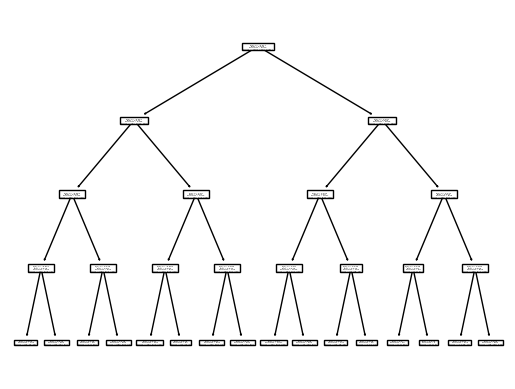

In [597]:
# Initialize the model
clf = tree.DecisionTreeClassifier(max_depth=4)

# Train the model
clf = clf.fit(X_train, Y_train)

# Predict the labels of the test set
Y_pred = clf.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(Y_test, Y_pred)
print(f"Model Accuracy: {accuracy*100:.2f}%")
tree.plot_tree(clf)
r = export_text(clf, feature_names=feature_names)
print(r)

## Logistic regression

In [598]:
model = LogisticRegression()
model.fit(X_train, Y_train)

LogisticRegression()

In [599]:
y_pred = model.predict(X_test)
accuracy = accuracy_score(Y_test, y_pred)
print(f"Accuracy: {accuracy*100:.2f}%")


Accuracy: 48.58%


In [606]:
sum(y_pred)

5

In [600]:
print(model.coef_)  # View coefficients
print(model.intercept_)  # View intercept


[[-0.08861957 -0.51009809 -0.49123323 -0.39385934]
 [ 0.28812368  0.8473932   0.07083297 -0.09202736]
 [-0.1995041  -0.33729511  0.42040027  0.4858867 ]]
[-0.27391758  0.4645767  -0.19065911]


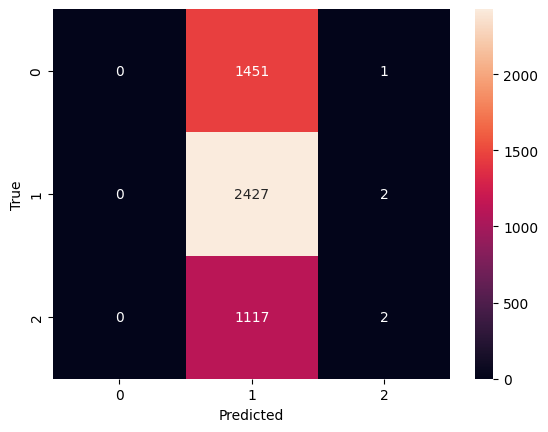

In [601]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

cm = confusion_matrix(Y_test, y_pred)
sns.heatmap(cm, annot=True, fmt="d")
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()


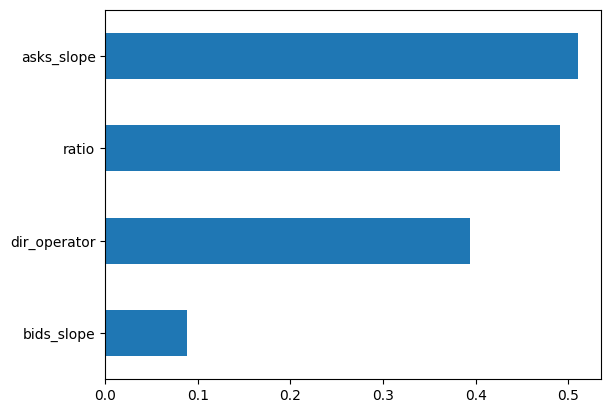

In [602]:
feature_importance = pd.Series(index=feature_names, data=np.abs(model.coef_[0]))
feature_importance.sort_values().plot(kind='barh')
plt.show()


In [608]:
df_train

,bids_slope,asks_slope,b_bid,b_ask,spread,ratio,dir_operator,returns,y
2024-01-25 14:19:54.284,0.031117,0.024634,69.01,69.11,0.10,-0.545455,-0.025069,-0.07,-1
2024-01-29 15:26:17.790,0.042289,0.036944,64.22,64.32,0.10,-0.722222,0.422500,-0.02,-1
2024-01-24 15:40:07.931,0.026754,0.011851,71.82,71.94,0.12,-0.629630,0.871111,0.02,1
2024-01-24 09:59:57.769,0.036714,0.026046,69.82,69.99,0.17,-0.315789,0.840278,0.11,1
2024-01-25 09:32:32.979,0.030306,0.015890,71.80,71.83,0.03,-0.269231,-0.390625,-0.12,-1
...,...,...,...,...,...,...,...,...,...
2024-01-25 10:37:34.767,0.027131,0.015922,71.50,71.72,0.22,-0.407407,-0.017778,-0.00,0
2024-01-24 13:53:58.559,0.038802,0.027501,70.05,70.10,0.05,-0.315789,1.000000,0.07,1
2024-01-30 14:15:56.940,0.034642,0.028766,65.15,65.30,0.15,-0.523810,-0.111111,-0.02,-1
2024-01-26 10:16:25.227,0.022788,0.015906,65.96,66.10,0.14,-0.518519,0.360000,0.00,0


## NN

In [100]:
import tensorflow as tf
print("TensorFlow version:", tf.__version__)
tf.config.run_functions_eagerly(True)

from tensorflow.keras.layers import Dense, Flatten, Conv2D, InputLayer
from tensorflow.keras import Model

TensorFlow version: 2.16.1


In [101]:
X_train = []
Y_train = []
X_test = []
Y_test = []
slope_mean = 0.02736
slope_std = 0.01
for row in df_train.to_dict(orient='records'):
    X_train.append([row['bids_slope'], row['asks_slope'], row['spread'], row['ratio'], row['dir_operator']])
    Y_train.append(row['y'])
    
for row in df_test.to_dict(orient='records'):
    X_test.append([row['bids_slope'], row['asks_slope'], row['spread'], row['ratio'], row['dir_operator']])
    Y_test.append(row['y'])
    


In [102]:
X_train = np.array(X_train)  # Converting list to numpy array for easier manipulation
means = X_train[:, :2].mean(axis=0)  # Calculate means of the first two columns
stds = X_train[:, :2].std(axis=0)  #
# Standardize training data
X_train[:, :2] = (X_train[:, :2] - means) / stds

# Convert X_test to numpy array and standardize using training data means and stds
X_test = np.array(X_test)
X_test[:, :2] = (X_test[:, :2] - means) / stds

In [103]:
from tensorflow.keras.layers import Input, Dense
from tensorflow.keras.models import Model


X_train = np.array(X_train)
Y_train = np.array(Y_train)
X_test = np.array(X_test)
Y_test = np.array(Y_test)
# Define the input shape. Note: the batch size is not included.
# Convert labels to categorical (one-hot encoding) if not already done

from tensorflow.keras.utils import to_categorical

def custom_one_hot_encoding(labels):
    encoded_labels = []
    for label in labels:
        if label == -1:
            encoded_labels.append([1, 0, 0])
        elif label == 0:
            encoded_labels.append([0, 1, 0])
        elif label == 1:
            encoded_labels.append([0, 0, 1])
        else:
            raise ValueError("Invalid label: {}".format(label))
    return np.array(encoded_labels)

# Transform the labels into one-hot encoded vectors
Y_train_encoded = custom_one_hot_encoding(Y_train)
Y_test_encoded = custom_one_hot_encoding(Y_test)

array([0, 1, 0])

### Model positive

In [104]:
input_shape = (5,)  # for 5 features

# This returns a tensor
inputs = Input(shape=input_shape)
# A layer instance is callable on a tensor, and returns a tensor
x = Dense(20, activation='relu')(inputs)
x = Dense(20, activation='relu')(x)
predictions = Dense(3, activation='softmax')(x)  # Assuming a softmax for multi-class classification

# This creates a model that includes
# the Input layer and three Dense layers
model = Model(inputs=inputs, outputs=predictions)

# Compile the model
model.compile(optimizer='adam',
              loss=positive_classifier_loss,
              metrics=['accuracy'])



In [105]:
# Train the model, iterating on the data in batches
model.fit(X_train, Y_train_encoded, epochs=5, batch_size=64)

# Evaluate the model on the test data
loss, accuracy = model.evaluate(X_test, Y_test_encoded)
print(f"Test Loss: {loss}, Test Accuracy: {accuracy}")

Epoch 1/5


C:\develop\EnergyTrading\env\Lib\site-packages\tensorflow\python\data\ops\structured_function.py:258: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


266/266 ━━━━━━━━━━━━━━━━━━━━ 156s 587ms/step - accuracy: 0.3643 - loss: 0.3075
Epoch 2/5
266/266 ━━━━━━━━━━━━━━━━━━━━ 168s 632ms/step - accuracy: 0.3964 - loss: 0.1757
Epoch 3/5
266/266 ━━━━━━━━━━━━━━━━━━━━ 193s 598ms/step - accuracy: 0.4071 - loss: 0.1682
Epoch 4/5
266/266 ━━━━━━━━━━━━━━━━━━━━ 214s 644ms/step - accuracy: 0.4041 - loss: 0.1649
Epoch 5/5
266/266 ━━━━━━━━━━━━━━━━━━━━ 184s 575ms/step - accuracy: 0.4195 - loss: 0.1614
375/375 ━━━━━━━━━━━━━━━━━━━━ 50s 133ms/step - accuracy: 0.4121 - loss: 0.1733
Test Loss: 0.1741095781326294, Test Accuracy: 0.4079166650772095


'2.16.1'

In [126]:
# Original input
input_data = np.array([3, -3, 0.1, -.2, -0.7])

# Reshape the input to have the shape (1, 4)
input_data_reshaped = np.expand_dims(input_data, axis=0)
# Alternatively, you can use: input_data_reshaped = input_data.reshape(1, 4)
res = model.predict(input_data_reshaped)
res

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


C:\develop\EnergyTrading\env\Lib\site-packages\tensorflow\python\data\ops\structured_function.py:258: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


array([[9.625936e-08, 1.603190e-01, 8.396809e-01]], dtype=float32)

In [21]:
res

array([[1.1760911e-08, 8.3487612e-01, 1.6512388e-01]], dtype=float32)

12/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

C:\develop\EnergyTrading\env\Lib\site-packages\tensorflow\python\data\ops\structured_function.py:258: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


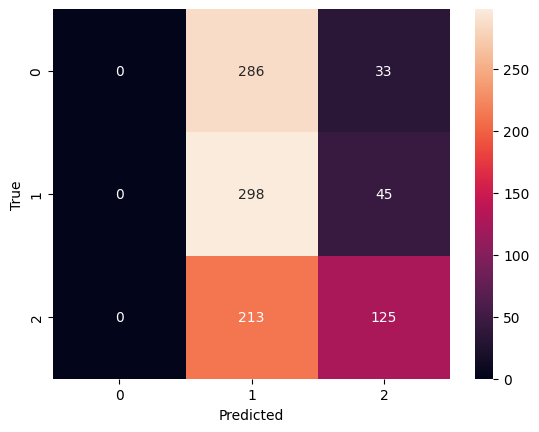

In [106]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming your model is already trained and you have X_test and Y_test

# Make predictions for the first 1000 samples from X_test
input_data = X_test[:1000]  # Assuming you want to use the first 1000 samples
y_pred = model.predict(input_data)

# Convert predicted probabilities to class labels
y_pred_classes = np.argmax(y_pred, axis=1)

# Convert true one-hot encoded labels to class labels
true_classes = np.argmax(Y_test_encoded[:1000], axis=1)

# Compute confusion matrix
cm = confusion_matrix(true_classes, y_pred_classes)

# Plot confusion matrix
sns.heatmap(cm, annot=True, fmt="d")
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()


In [14]:
Y_test_encoded

array([[1, 0, 0],
       [0, 1, 0],
       [0, 0, 1],
       ...,
       [0, 1, 0],
       [0, 1, 0],
       [0, 1, 0]])

In [43]:
Y_train_encoded[1]

array([0., 0., 1.])

In [125]:
!pip install numpy==1.23

     ---------------------------------------- 10.7/10.7 MB 1.4 MB/s eta 0:00:00
  Installing build dependencies: started
  Installing build dependencies: finished with status 'done'
  Getting requirements to build wheel: started
  Getting requirements to build wheel: finished with status 'done'
  Preparing metadata (pyproject.toml): started
  Preparing metadata (pyproject.toml): finished with status 'done'
  Created wheel for numpy: filename=numpy-1.23.0-cp311-cp311-win_amd64.whl size=5961176 sha256=4f68e814554b05036e4647496d9042afe27e78dded3e8153cdd6d754438da022
  Stored in directory: c:\users\scasny\appdata\local\pip\cache\wheels\27\db\66\106eb7b3d91d67c2eb7921b3181063291f54c50505f3fd7128
Successfully built numpy
  Attempting uninstall: numpy
    Found existing installation: numpy 1.24.0
    Uninstalling numpy-1.24.0:
      Successfully uninstalled numpy-1.24.0


ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
ml-dtypes 0.3.2 requires numpy>=1.23.3; python_version >= "3.11", but you have numpy 1.23.0 which is incompatible.
pandas 2.1.2 requires numpy<2,>=1.23.2; python_version == "3.11", but you have numpy 1.23.0 which is incompatible.
refinitiv-data 1.3.1 requires requests<=2.28.1, but you have requests 2.31.0 which is incompatible.
refinitiv-data 1.3.1 requires websocket-client!=1.2.2,<=1.5.1,>=0.58.0, but you have websocket-client 1.7.0 which is incompatible.
tensorflow-intel 2.16.1 requires numpy<2.0.0,>=1.23.5; python_version <= "3.11", but you have numpy 1.23.0 which is incompatible.

[notice] A new release of pip available: 22.3.1 -> 24.0
[notice] To update, run: python.exe -m pip install --upgrade pip


## XGboost

### Prepare data with specific lables

In [238]:
import pandas as pd
import numpy as np
import pickle

from sklearn.model_selection import train_test_split
from sklearn import tree
from sklearn.tree import export_text
from sklearn.metrics import accuracy_score
from sklearn.linear_model import LogisticRegression

with open(r"C:\develop\EnergyTrading\Python\Strategies\ob_sps_train.pkl", 'rb') as f:
    df_train = pickle.load(f)

with open(r"C:\develop\EnergyTrading\Python\Strategies\ob_sps_test.pkl", 'rb') as f:
    df_test = pickle.load(f)

In [258]:
d = DirectionalOperator(.3)

In [246]:
df_train['mid'] = (df_train['b_ask']+df_train['b_bid'])/2

In [247]:
df_train['mid_diff'] = df_train['mid'].diff(1)

In [260]:
result = []
for x in df_train['mid_diff'].dropna():
    d.update(x)
    result.append(d.evaluate())

<Axes: >

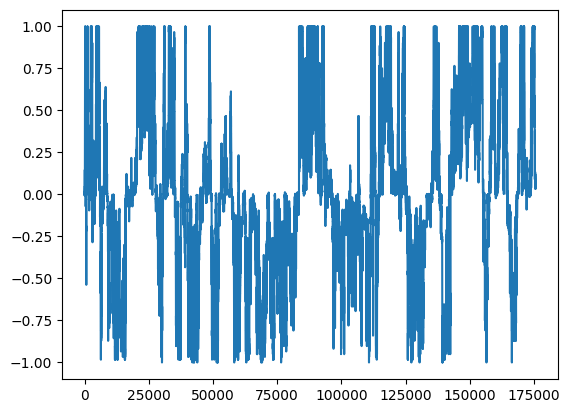

In [262]:
pd.Series(result).plot()

<Axes: >

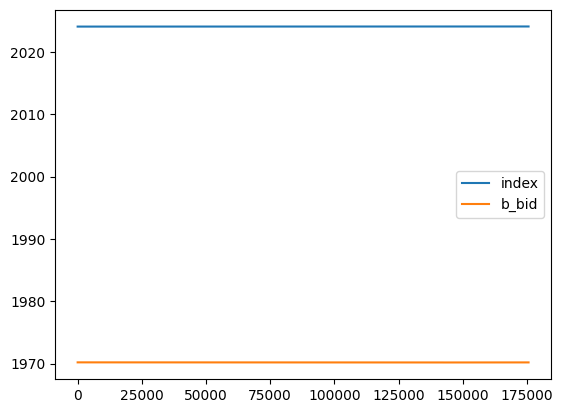

In [265]:
df_train['b_bid'].reset_index().plot()

In [2]:
    
from sklearn.utils import resample

def down_sample_split(df):# Separate the majority and minority classes
    slope_mean = 0.02736
    slope_std = 0.01
    df['bids_slope'] = df['bids_slope'].map(lambda x: (x-slope_mean)/slope_std)
    df['asks_slope'] = df['asks_slope'].map(lambda x: (x-slope_mean)/slope_std)

#     df = df[(df['ratio'] > 0.25) | (df['ratio'] < -.25)]
    df['y'] = df['returns'].map(lambda x: 1 if x > 0 else -1 if x < 0 else 0)
    df.loc[(df['spread'] + abs(df['returns'])) < 0.1, 'y'] = 0
    df_majority = df[df.y == 0]
    df_positive = df[df.y == 1]
    df_negative = df[df.y == -1]
    df_negative['y'] = df_negative['y'].map(lambda x: 1 if x < 0 else 0)
    
    # Downsample the majority class
    df_majority_downsampled = resample(df_majority, 
                                       replace=False,    # sample without replacement
                                       n_samples=len(df_positive), # to match minority class
                                       random_state=123) # reproducible results
    
    # Combine the downsampled majority class with the minority classes
    return pd.concat([df_majority_downsampled, df_positive]).sample(19000).reset_index(), pd.concat([df_majority_downsampled, df_negative]).sample(19000).reset_index()
def down_sample_df(df):# Separate the majority and minority classes
    slope_mean = 0.02736
    slope_std = 0.01
    df['bids_slope'] = df['bids_slope'].map(lambda x: (x-slope_mean)/slope_std)
    df['asks_slope'] = df['asks_slope'].map(lambda x: (x-slope_mean)/slope_std)

#     df = df[(df['ratio'] > 0.25) | (df['ratio'] < -.25)]
    df['y'] = df['returns'].map(lambda x: 1 if x > 0 else -1 if x < 0 else 0)
    df.loc[(df['spread'] + abs(df['returns'])) < 0.1, 'y'] = 0
    df_majority = df[df.y == 0]
    df_positive = df[df.y == 1]
    df_negative = df[df.y == -1]
    
    # Downsample the majority class
    df_majority_downsampled = resample(df_majority, 
                                       replace=False,    # sample without replacement
                                       n_samples=len(df_positive), # to match minority class
                                       random_state=123) # reproducible results
    
    # Combine the downsampled majority class with the minority classes
    return pd.concat([df_majority_downsampled, df_positive, df_negative]).sample(20000).reset_index()

def custom_one_hot_encoding(labels):
    encoded_labels = []
    for label in labels:
        if label == -1:
            encoded_labels.append(0)
        elif label == 0:
            encoded_labels.append(1)
        elif label == 1:
            encoded_labels.append(2)
        else:
            raise ValueError("Invalid label: {}".format(label))
    return encoded_labels


df_train_pos, df_train_neg = down_sample_split(df_train)
### Mix model
df_test = down_sample_df(df_test)
y_test = custom_one_hot_encoding(df_test['y'])

C:\Users\scasny\AppData\Local\Temp\ipykernel_23044\2756266317.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_negative['y'] = df_negative['y'].map(lambda x: 1 if x < 0 else 0)


In [172]:
df_train_pos

,index,bids_slope,asks_slope,b_bid,b_ask,spread,ratio,dir_operator,returns,y
0,2024-01-25 15:15:31.150,-1.398369,-0.322836,68.70,68.80,0.10,0.290323,-0.422500,0.00,0
1,2024-01-30 11:39:37.044,-0.799692,-0.919800,64.25,64.49,0.24,-0.166667,0.444444,0.00,0
2,2024-01-29 12:09:42.393,-0.307984,0.527985,63.87,63.99,0.12,0.526316,-0.258403,0.00,0
3,2024-01-25 12:40:36.788,-0.367064,-0.155979,69.91,70.00,0.09,0.187500,-0.422500,0.03,1
4,2024-01-25 15:18:00.560,-1.355907,0.896906,68.61,68.71,0.10,0.777778,-0.902500,0.01,1
...,...,...,...,...,...,...,...,...,...,...
18995,2024-01-25 12:04:57.951,-0.942566,-1.097887,70.88,71.00,0.12,0.382353,-0.013611,0.10,1
18996,2024-01-30 12:55:19.419,-0.168979,-0.986317,64.66,64.85,0.19,0.100000,0.360000,0.00,0
18997,2024-01-29 15:45:30.427,0.807261,1.764543,63.68,63.86,0.18,0.714286,-0.840278,0.00,0
18998,2024-01-26 16:16:33.530,1.186041,-1.545084,66.17,66.28,0.11,-0.807692,-0.321111,0.22,1


### Pos/neg models

In [3]:
from xgboost import XGBClassifier, plot_tree
import xgboost as xgb
import shap

In [4]:
xgb_slope_pos = XGBClassifier(max_depth=4, colsample_bytree=0.5, gamma=1, min_child_weight=5, n_estimators=100)
xgb_slope_pos.fit(df_train_pos[['bids_slope', 'asks_slope', 'ratio', 'dir_operator', 'spread']], df_train_pos['y'], eval_metric='logloss')

C:\develop\EnergyTrading\env\Lib\site-packages\xgboost\sklearn.py:889: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(


XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.5, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=1, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=4, max_leaves=None,
              min_child_weight=5, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=100, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...)

In [5]:
preds = xgb_slope_pos.predict_proba(df_test_pos[['bids_slope', 'asks_slope', 'ratio', 'dir_operator', 'spread']])

NameError: name 'df_test_pos' is not defined

#### Metrics

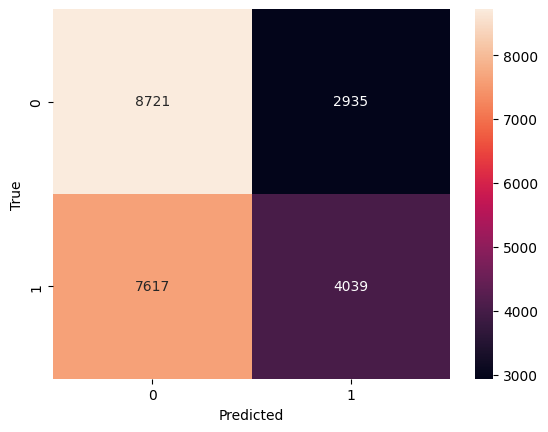

Precision: 0.5791511327788931


In [51]:
import seaborn as sns
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
cm = confusion_matrix(df_test_pos['y'], preds)

# Plot confusion matrix
sns.heatmap(cm, annot=True, fmt="d")
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()

true_positives = cm[1, 1]  # Actual positive (1) and predicted positive (1)
false_positives = cm[0, 1]  # Actual negative (0) but predicted positive (1)

precision = true_positives / (true_positives + false_positives)
print("Precision:", precision)

C:\develop\EnergyTrading\env\Lib\site-packages\xgboost\sklearn.py:889: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(


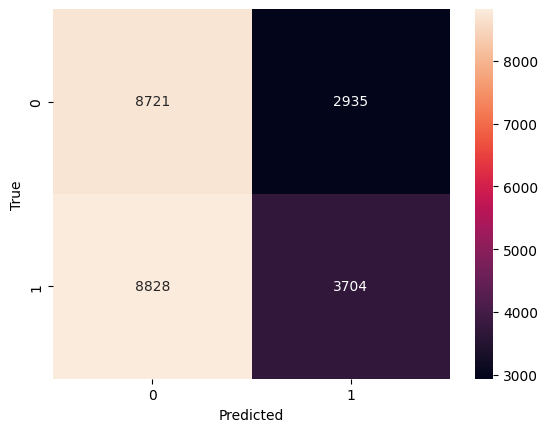

Precision: 0.5579153486970929


In [52]:
xgb_slope_neg = XGBClassifier(max_depth=4, colsample_bytree=0.5, gamma=1, min_child_weight=5, n_estimators=100)
xgb_slope_neg.fit(df_train_neg[['bids_slope', 'asks_slope', 'ratio', 'dir_operator', 'spread']], df_train_neg['y'], eval_metric='logloss')
preds = xgb_slope_neg.predict(df_test_neg[['bids_slope', 'asks_slope', 'ratio', 'dir_operator', 'spread']])
import seaborn as sns
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
cm = confusion_matrix(df_test_neg['y'], preds)

# Plot confusion matrix
sns.heatmap(cm, annot=True, fmt="d")
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()

true_positives = cm[1, 1]  # Actual positive (1) and predicted positive (1)
false_positives = cm[0, 1]  # Actual negative (0) but predicted positive (1)

precision = true_positives / (true_positives + false_positives)
print("Precision:", precision)

In [45]:
xgb_slope_neg.predict_proba([[-1.5, 1.5]])

array([[0.78105927, 0.21894075]], dtype=float32)

### Mixed stacking model

In [6]:
xgb_pos = XGBClassifier(max_depth=4, colsample_bytree=0.5, gamma=1, min_child_weight=5, n_estimators=100)
xgb_pos.fit(df_train_pos.loc[:10000, ['bids_slope', 'asks_slope', 'ratio', 'dir_operator', 'spread']], df_train_pos.loc[:10000,'y'], eval_metric='logloss')
xgb_neg = XGBClassifier(max_depth=4, colsample_bytree=0.5, gamma=1, min_child_weight=5, n_estimators=100)
xgb_neg.fit(df_train_neg.loc[:10000, ['bids_slope', 'asks_slope', 'ratio', 'dir_operator', 'spread']], df_train_neg.loc[:10000, 'y'], eval_metric='logloss')

pos_outputs = xgb_pos.predict_proba(df_test.loc[:10000-1, ['bids_slope', 'asks_slope', 'ratio', 'dir_operator', 'spread']])[:,1]
neg_outputs = xgb_neg.predict_proba(df_test.loc[:10000-1, ['bids_slope', 'asks_slope', 'ratio', 'dir_operator', 'spread']])[:,1]

C:\develop\EnergyTrading\env\Lib\site-packages\xgboost\sklearn.py:889: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
C:\develop\EnergyTrading\env\Lib\site-packages\xgboost\sklearn.py:889: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(


In [7]:
xgb_mixed = XGBClassifier(max_depth=4, num_class=3, colsample_bytree=0.5, gamma=1, min_child_weight=5, n_estimators=100, objective='multi:softmax')
xgb_mixed.fit([[neg, pos] for pos,neg in zip(pos_outputs, neg_outputs)], y_test[:10000])

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.5, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=1, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=4, max_leaves=None,
              min_child_weight=5, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=100, n_jobs=None, num_class=3,
              num_parallel_tree=None, ...)

In [8]:
xgb_mixed.predict_proba([[.9,.1]])

array([[0.13905668, 0.4735024 , 0.3874409 ]], dtype=float32)

In [9]:
X_mix_pos = xgb_pos.predict_proba(df_test.loc[10000:, ['bids_slope', 'asks_slope', 'ratio', 'dir_operator', 'spread']])[:,1]
X_mix_neg = xgb_neg.predict_proba(df_test.loc[10000:, ['bids_slope', 'asks_slope', 'ratio', 'dir_operator', 'spread']])[:,1]

In [10]:
mix_preds = xgb_mixed.predict_proba([[neg, pos] for pos,neg in zip(X_mix_pos, X_mix_neg)])

C:\develop\EnergyTrading\env\Lib\site-packages\scipy\special\_logsumexp.py:223: RuntimeWarning: invalid value encountered in divide
  return exp_x_shifted / np.sum(exp_x_shifted, axis=axis, keepdims=True)


In [11]:
mix_preds_cropped = []
for x in mix_preds:
    x_max = max(x)
    max_index = np.where(x == x.max())[0][0]
    pred_value = None
    if max_index == 2:
        if (x_max - x[0]) > .08:
            pred_value = max_index
        else:
            pred_value = 1
    elif max_index == 0:
        if (x_max - x[2]) > .08:
            pred_value = max_index
        else:
            pred_value = 1
    else:
        pred_value = 1
    mix_preds_cropped.append(pred_value)

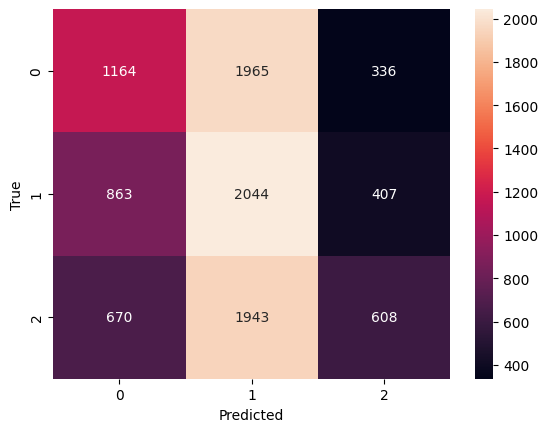

Precision long: 0.6440677966101694
Precision short: 0.6346782988004362


In [12]:
import seaborn as sns
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
cm = confusion_matrix(y_test[10000:], mix_preds_cropped)

# Plot confusion matrix
sns.heatmap(cm, annot=True, fmt="d")
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()

true_positives = cm[2, 2]  # Actual positive (1) and predicted positive (1)
false_positives = cm[0, 2]  # Actual negative (0) but predicted positive (1)

precision = true_positives / (true_positives + false_positives)
print("Precision long:", precision)

true_positives = cm[0, 0]  # Actual positive (1) and predicted positive (1)
false_positives = cm[2, 0]  # Actual negative (0) but predicted positive (1)

precision = true_positives / (true_positives + false_positives)
print("Precision short:", precision)

C:\develop\EnergyTrading\env\Lib\site-packages\shap\explainers\_tree.py:664: RuntimeWarning: invalid value encountered in divide
  if np.max(diff / (np.abs(sum_val) + 1e-2)) > 1e-2:


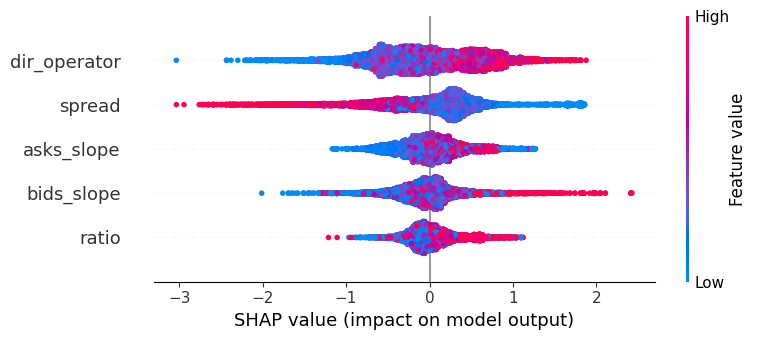

In [15]:
import shap

explainer = shap.TreeExplainer(xgb_pos)
col_preds = ['bids_slope', 'asks_slope', 'ratio', 'dir_operator', 'spread']
shap_values = explainer.shap_values(df_train_pos[col_preds])
shap.summary_plot(shap_values, df_train_pos[col_preds])

C:\develop\EnergyTrading\env\Lib\site-packages\shap\explainers\_tree.py:664: RuntimeWarning: invalid value encountered in divide
  if np.max(diff / (np.abs(sum_val) + 1e-2)) > 1e-2:


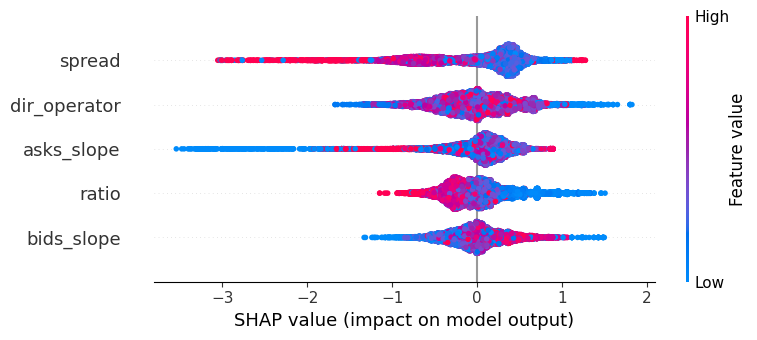

In [16]:
explainer = shap.TreeExplainer(xgb_neg)
col_preds = ['bids_slope', 'asks_slope', 'ratio', 'dir_operator', 'spread']
shap_values = explainer.shap_values(df_train_neg[col_preds])
shap.summary_plot(shap_values, df_train_neg[col_preds])

In [1]:
xgb_mixed.predict_proba([[.3]])

NameError: name 'xgb_mixed' is not defined

In [163]:
xgb_pos.save_model('xgb_model_pos_v2.json')
xgb_neg.save_model('xgb_model_neg_v2.json')
xgb_mixed.save_model('xgb_model_mixed_v2.json')

In [26]:
xgb_pos.predict_proba([[3, 3, 0.9, .1, 0.6]])

array([[0.16184872, 0.8381513 ]], dtype=float32)

### XG mixed v2

In [208]:
xgb_pos = XGBClassifier(max_depth=4, colsample_bytree=0.5, gamma=1, min_child_weight=5, n_estimators=100)
xgb_pos.fit(df_train_pos.loc[:10000, ['bids_slope', 'asks_slope', 'ratio']], df_train_pos.loc[:10000,'y'], eval_metric='logloss')
xgb_neg = XGBClassifier(max_depth=4, colsample_bytree=0.5, gamma=1, min_child_weight=5, n_estimators=100)
xgb_neg.fit(df_train_neg.loc[:10000, ['bids_slope', 'asks_slope', 'ratio']], df_train_neg.loc[:10000, 'y'], eval_metric='logloss')

pos_outputs = xgb_pos.predict_proba(df_test.loc[:10000-1, ['bids_slope', 'asks_slope', 'ratio']])[:,1]
neg_outputs = xgb_neg.predict_proba(df_test.loc[:10000-1, ['bids_slope', 'asks_slope', 'ratio']])[:,1]
price_m_output = np.array(df_test.loc[:10000, 'dir_operator'])

C:\develop\EnergyTrading\env\Lib\site-packages\xgboost\sklearn.py:889: UserWarning:

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

C:\develop\EnergyTrading\env\Lib\site-packages\xgboost\sklearn.py:889: UserWarning:

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.



In [46]:
np.array(price_m_output)

array([-0.05444444, -0.65340278, -0.5625    , ..., -0.84027778,
        0.44444444,  0.26694444])

In [235]:
xgb_mixed = XGBClassifier(max_depth=2, num_class=3, colsample_bytree=0.5, gamma=1, min_child_weight=5, n_estimators=5, objective='multi:softmax')
xgb_mixed.fit([[neg, pos, pm] for pos,neg,pm in zip(pos_outputs, neg_outputs, price_m_output)], y_test[:10000])

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.5, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=1, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=2, max_leaves=None,
              min_child_weight=5, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=5, n_jobs=None, num_class=3,
              num_parallel_tree=None, ...)

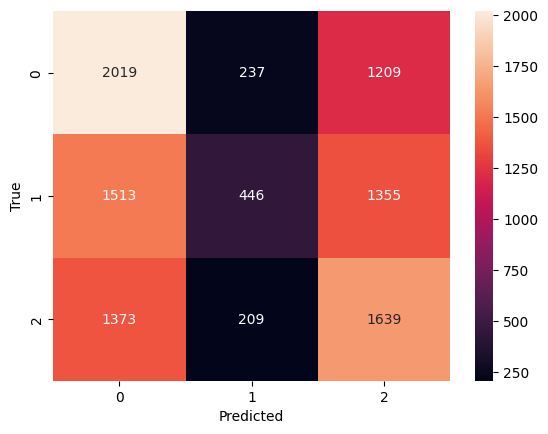

Precision long: 0.5754915730337079
Precision short: 0.5952240566037735


In [236]:
X_mix_pos = xgb_pos.predict_proba(df_test.loc[10000:, ['bids_slope', 'asks_slope', 'ratio']])[:,1]
X_mix_neg = xgb_neg.predict_proba(df_test.loc[10000:, ['bids_slope', 'asks_slope', 'ratio']])[:,1]
X_pm = np.array(df_test.loc[10000:, 'dir_operator'])
mix_preds = xgb_mixed.predict([[neg, pos, pm] for pos,neg,pm in zip(X_mix_pos, X_mix_neg, X_pm)])

mix_preds_cropped = []
# for x in mix_preds:
#     x_max = max(x)
#     max_index = np.where(x == x.max())[0][0]
#     pred_value = None
#     if max_index == 2:
#         if (x_max - x[0]) > .06:
#             pred_value = max_index
#         else:
#             pred_value = 1
#     elif max_index == 0:
#         if (x_max - x[2]) > .06:
#             pred_value = max_index
#         else:
#             pred_value = 1
#     else:
#         pred_value = 1
#     mix_preds_cropped.append(pred_value)
    
import seaborn as sns
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
cm = confusion_matrix(y_test[10000:], mix_preds)

# Plot confusion matrix
sns.heatmap(cm, annot=True, fmt="d")
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()

true_positives = cm[2, 2]  # Actual positive (1) and predicted positive (1)
false_positives = cm[0, 2]  # Actual negative (0) but predicted positive (1)

precision = true_positives / (true_positives + false_positives)
print("Precision long:", precision)

true_positives = cm[0, 0]  # Actual positive (1) and predicted positive (1)
false_positives = cm[2, 0]  # Actual negative (0) but predicted positive (1)

precision = true_positives / (true_positives + false_positives)
print("Precision short:", precision)

In [237]:
xgb_mixed.feature_importances_

array([0.27719653, 0.25704592, 0.4657575 ], dtype=float32)

In [179]:
xgb_pos.predict_proba([[2,-2, .5]])

array([[0.6734489, 0.3265511]], dtype=float32)

C:\develop\EnergyTrading\env\Lib\site-packages\shap\explainers\_tree.py:664: RuntimeWarning: invalid value encountered in divide
  if np.max(diff / (np.abs(sum_val) + 1e-2)) > 1e-2:


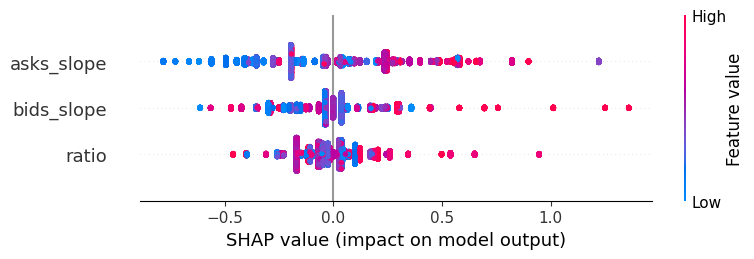

In [51]:
import shap

explainer = shap.TreeExplainer(xgb_pos)
col_preds = ['bids_slope', 'asks_slope', 'ratio']
shap_values = explainer.shap_values(df_train_pos[col_preds])
shap.summary_plot(shap_values, df_train_pos[col_preds])

C:\develop\EnergyTrading\env\Lib\site-packages\shap\explainers\_tree.py:664: RuntimeWarning: invalid value encountered in divide
  if np.max(diff / (np.abs(sum_val) + 1e-2)) > 1e-2:


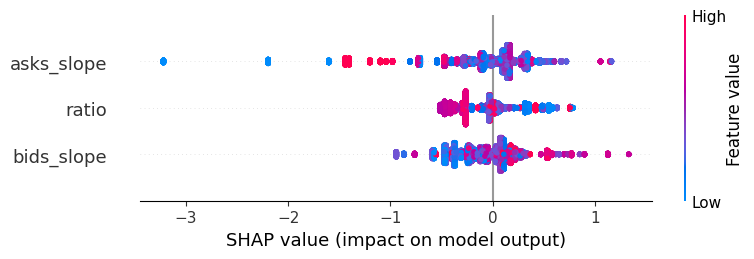

In [52]:
import shap

explainer = shap.TreeExplainer(xgb_neg)
col_preds = ['bids_slope', 'asks_slope', 'ratio']
shap_values = explainer.shap_values(df_train_pos[col_preds])
shap.summary_plot(shap_values, df_train_pos[col_preds])

C:\develop\EnergyTrading\env\Lib\site-packages\shap\explainers\_tree.py:664: RuntimeWarning: invalid value encountered in divide
  if np.max(diff / (np.abs(sum_val) + 1e-2)) > 1e-2:


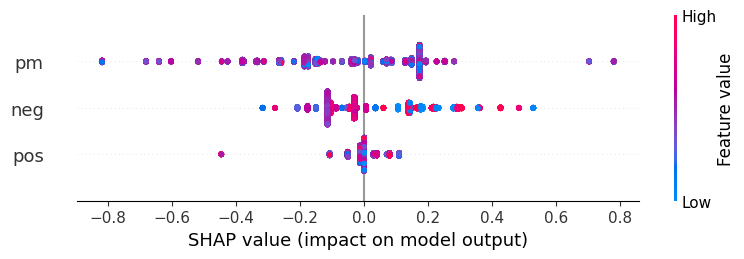

In [158]:
import shap
df_mix = pd.DataFrame({'neg': X_mix_neg, 'pos': X_mix_pos, 'pm': X_pm})
explainer = shap.TreeExplainer(xgb_mixed)
shap_values = explainer.shap_values(df_mix)
avg_shap_values = np.mean(shap_values, axis=1)
shap.summary_plot(shap_values[:,0], df_mix)

In [175]:
modeel := XGBClassifier().load_model(fname='xgb_model_pos_v2.json')

SyntaxError: invalid syntax (2725601939.py, line 1)

In [174]:
modeel.predict_proba([[-3,3,.9]])

AttributeError: 'NoneType' object has no attribute 'predict_proba'

### XG mixed v3 - simplified trees

In [ ]:
xgb_pos = XGBClassifier(max_depth=2, colsample_bytree=0.5, gamma=1, min_child_weight=5, n_estimators=5)
xgb_pos.fit(df_train_pos.loc[:10000, ['bids_slope', 'asks_slope', 'ratio']], df_train_pos.loc[:10000,'y'], eval_metric='logloss')
xgb_neg = XGBClassifier(max_depth=2, colsample_bytree=0.5, gamma=1, min_child_weight=5, n_estimators=5)
xgb_neg.fit(df_train_neg.loc[:10000, ['bids_slope', 'asks_slope', 'ratio']], df_train_neg.loc[:10000, 'y'], eval_metric='logloss')

In [234]:
pos_outputs = xgb_pos.predict_proba(df_test.loc[:10000-1, ['bids_slope', 'asks_slope', 'ratio']])[:,1]
neg_outputs = xgb_neg.predict_proba(df_test.loc[:10000-1, ['bids_slope', 'asks_slope', 'ratio']])[:,1]
price_m_output = np.array(df_test.loc[:10000, 'dir_operator'])

In [192]:
x = np.arange(-3,3,0.05)
y = np.arange(-3,3,0.05)
z = np.array([xgb_pos.predict_proba([[x_i, y_i, 0]])[0][1] for x_i, y_i in zip(x,y)])

In [211]:
# Define x and y ranges
x_range = np.arange(-3, 3, 0.1)
y_range = np.arange(-3, 3, 0.1)

# Create meshgrid of x and y values
x_grid, y_grid = np.meshgrid(x_range, y_range)

# Flatten the grid matrices to compute z values for all combinations
x_flat = x_grid.flatten()
y_flat = y_grid.flatten()

# Compute z values using the model's predict_proba method
z = np.array([xgb_pos.predict_proba([[x_i, y_i, 0]])[0][1] for x_i, y_i in zip(x_flat, y_flat)])

# Reshape z values to match the shape of x_grid and y_grid
z_grid = z.reshape(x_grid.shape)

In [205]:
z_grid

array([[0.19018291, 0.19018291, 0.19018291, ..., 0.4100276 , 0.4100276 ,
        0.4100276 ],
       [0.19018291, 0.19018291, 0.19018291, ..., 0.4100276 , 0.4100276 ,
        0.4100276 ],
       [0.19018291, 0.19018291, 0.19018291, ..., 0.4100276 , 0.4100276 ,
        0.4100276 ],
       ...,
       [0.35012603, 0.35012603, 0.35012603, ..., 0.6145516 , 0.6145516 ,
        0.6145516 ],
       [0.43230996, 0.43230996, 0.43230996, ..., 0.69265014, 0.69265014,
        0.69265014],
       [0.43230996, 0.43230996, 0.43230996, ..., 0.69265014, 0.69265014,
        0.69265014]], dtype=float32)

In [48]:
import plotly.graph_objects as go

fig = go.Figure(data=[go.Surface(z=z_grid, x=x_grid, y=y_grid)])
fig.update_layout(title='pos model | ratio=0.0', autosize=False,
                  width=500, height=500,
                  margin=dict(l=65, r=50, b=65, t=90))
fig.show()

NameError: name 'z_grid' is not defined

In [233]:
import plotly.graph_objects as go
import numpy as np

# Define x and y ranges
x_range = np.arange(-3, 3, 0.1)
y_range = np.arange(-3, 3, 0.1)

# Create meshgrid of x and y values
x_grid, y_grid = np.meshgrid(x_range, y_range)

# Flatten the grid matrices to compute z values for all combinations
x_flat = x_grid.flatten()
y_flat = y_grid.flatten()

# Define function to compute z values
def compute_z(ratio):
    return np.array([xgb_pos.predict_proba([[x_i, y_i, ratio]])[0][1] for x_i, y_i in zip(x_flat, y_flat)])

# Compute initial z values
initial_ratio = 0.0
z_grid = compute_z(initial_ratio)

# Create figure
fig = go.Figure()

# Add traces, one for each slider step
for ratio in np.arange(-1.0, 1.1, 0.1):
    z_values = compute_z(ratio)
    fig.add_trace(
        go.Surface(
            visible=False,
            z=z_values.reshape(x_grid.shape),
            x=x_grid,
            y=y_grid,
            name=f"Ratio: {ratio:.2f}"
        )
    )

# Make initial trace visible
fig.data[10].visible = True

# Create slider steps
steps = []
for i, ratio in enumerate(np.arange(-1.0, 1.1, 0.1)):
    step = dict(
        method="update",
        args=[{"visible": [False] * len(fig.data)},
              {"title": f"pos model | ratio={ratio:.2f}"}],
    )
    step["args"][0]["visible"][i] = True  # Toggle corresponding trace to "visible"
    steps.append(step)

# Create and add slider
sliders = [dict(
    active=10,
    currentvalue={"prefix": "Ratio: "},
    steps=steps
)]

fig.update_layout(
    title='pos model | ratio=0.0',
    autosize=False,
    width=800,
    height=600,
    margin=dict(l=65, r=50, b=65, t=90),
    sliders=sliders
)

# Show plot
fig.show()


In [223]:
xgb_pos.predict_proba([[-3,2.9,1.0]])

array([[0.61784, 0.38216]], dtype=float32)

# Analysis NEW!

In [3]:
import pickle
import pandas as pd

In [4]:
df_data = pickle.load(open(r"C:\develop\EnergyTrading\Python\Strategies\Sparsity_strategy\aaaa.pkl", 'rb'))

In [36]:
df_data

,timestamp,asks_density,bids_density,weighted_mid,price_movement,ba_spread,bid_price,ask_price,b_bid_volume,b_bid_broker,b_ask_volume,b_ask_broker,sb_bid_price,sb_bid_volume,sb_ask_price,sb_ask_volume,mid_price,trd_price,trd_side,last_trd_p
0,2024-02-01 09:00:00,0.503,0.171,-0.173103,-0.000000,0.10,70.50,70.60,1,TFS,1,OTC,70.40,5,70.67,2,70.550,70.4,0.0,70.4
1,2024-02-01 09:00:01,0.572,0.180,0.151351,-0.000000,0.10,70.50,70.60,1,TFS,1,OTC,70.40,1,70.67,2,70.550,70.6,1.0,70.6
2,2024-02-01 09:00:02,0.479,0.180,0.167838,-0.000000,0.10,70.50,70.60,1,TFS,1,OTC,70.40,1,70.67,2,70.550,NaN,NaN,70.6
3,2024-02-01 09:00:03,0.479,0.180,0.167838,-0.000000,0.10,70.50,70.60,1,TFS,1,OTC,70.40,1,70.67,2,70.550,NaN,NaN,70.6
4,2024-02-01 09:00:04,0.474,0.180,0.178649,-0.000000,0.10,70.50,70.60,1,TFS,1,OTC,70.40,1,70.67,2,70.550,NaN,NaN,70.6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
575695,2024-02-27 17:24:55,0.535,0.519,0.492941,1.000000,0.24,58.36,58.60,3,TFS,2,EEX,58.35,1,58.60,2,58.480,NaN,NaN,58.4
575696,2024-02-27 17:24:56,0.478,0.894,0.515303,0.983403,0.23,58.36,58.59,3,TFS,2,EEX,58.35,1,58.60,1,58.475,NaN,NaN,58.4
575697,2024-02-27 17:24:57,0.536,0.614,0.511970,0.983403,0.23,58.36,58.59,3,TFS,2,EEX,58.35,1,58.60,1,58.475,NaN,NaN,58.4
575698,2024-02-27 17:24:58,0.553,0.614,0.516515,0.983403,0.23,58.36,58.59,3,TFS,2,EEX,58.35,1,58.60,1,58.475,NaN,NaN,58.4


In [45]:
def index_broker_eex_traded(df):
    idx_list = []
    for idx, row in enumerate(df.to_dict(orient='records')):
        if row['trd_price'] > row['ask_price'] or row['trd_price'] < row['bid_price']: idx_list.append(idx)
    return idx_list
    

In [46]:
idx_list = index_broker_eex_traded(df_data)
df_data.iloc[idx_list]

,timestamp,asks_density,bids_density,weighted_mid,price_movement,ba_spread,bid_price,ask_price,b_bid_volume,b_bid_broker,b_ask_volume,b_ask_broker,sb_bid_price,sb_bid_volume,sb_ask_price,sb_ask_volume,mid_price,trd_price,trd_side,last_trd_p
0,2024-02-01 09:00:00,0.503,0.171,-0.173103,-0.000000,0.10,70.50,70.60,1,TFS,1,OTC,70.40,5,70.67,2,70.550,70.40,0.0,70.40
411,2024-02-01 09:06:51,0.769,0.450,0.308049,-0.090000,0.24,70.34,70.58,2,EEX,2,EEX,70.33,1,70.60,3,70.460,70.60,1.0,70.60
2152,2024-02-01 09:35:52,0.313,1.083,0.460000,-0.090000,0.14,69.81,69.95,3,EEX,2,OTC,69.80,1,70.09,1,69.880,70.00,1.0,70.00
2215,2024-02-01 09:36:55,0.205,1.014,0.593148,0.202500,0.09,70.06,70.15,1,EEX,3,EEX,70.05,1,70.25,1,70.105,70.05,0.0,70.05
2331,2024-02-01 09:38:51,0.463,1.461,0.515455,0.040000,0.02,70.02,70.04,1,EEX,1,EEX,70.01,3,70.05,3,70.030,70.01,0.0,70.01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
575316,2024-02-27 17:18:36,0.374,0.603,0.258000,0.160000,-0.10,58.05,57.95,1,EEX,5,OTC,57.96,1,58.11,1,58.000,58.00,1.0,58.00
575386,2024-02-27 17:19:46,0.136,0.920,0.473485,0.266944,-0.17,58.12,57.95,2,EEX,5,OTC,58.11,1,58.20,2,58.035,58.20,0.0,58.20
575387,2024-02-27 17:19:47,0.073,0.838,0.499545,0.340278,-0.21,58.16,57.95,2,EEX,5,OTC,58.15,1,58.25,1,58.055,58.25,0.0,58.25
575421,2024-02-27 17:20:21,0.266,0.234,0.460667,1.000000,0.03,58.22,58.25,2,EEX,1,EEX,58.21,1,58.49,2,58.235,58.28,1.0,58.28


In [47]:
filtered_df = df_data.iloc[idx_list]

In [53]:
filtered_df['density_diff'] = abs(filtered_df['asks_density'] - filtered_df['bids_density'])

C:\Users\scasny\AppData\Local\Temp\ipykernel_18260\3732326587.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df['density_diff'] = abs(filtered_df['asks_density'] - filtered_df['bids_density'])


In [54]:
filtered_df

,timestamp,asks_density,bids_density,weighted_mid,price_movement,ba_spread,bid_price,ask_price,b_bid_volume,b_bid_broker,...,b_ask_broker,sb_bid_price,sb_bid_volume,sb_ask_price,sb_ask_volume,mid_price,trd_price,trd_side,last_trd_p,density_diff
0,2024-02-01 09:00:00,0.503,0.171,-0.173103,-0.000000,0.10,70.50,70.60,1,TFS,...,OTC,70.40,5,70.67,2,70.550,70.40,0.0,70.40,0.332
411,2024-02-01 09:06:51,0.769,0.450,0.308049,-0.090000,0.24,70.34,70.58,2,EEX,...,EEX,70.33,1,70.60,3,70.460,70.60,1.0,70.60,0.319
2152,2024-02-01 09:35:52,0.313,1.083,0.460000,-0.090000,0.14,69.81,69.95,3,EEX,...,OTC,69.80,1,70.09,1,69.880,70.00,1.0,70.00,0.770
2215,2024-02-01 09:36:55,0.205,1.014,0.593148,0.202500,0.09,70.06,70.15,1,EEX,...,EEX,70.05,1,70.25,1,70.105,70.05,0.0,70.05,0.809
2331,2024-02-01 09:38:51,0.463,1.461,0.515455,0.040000,0.02,70.02,70.04,1,EEX,...,EEX,70.01,3,70.05,3,70.030,70.01,0.0,70.01,0.998
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
575316,2024-02-27 17:18:36,0.374,0.603,0.258000,0.160000,-0.10,58.05,57.95,1,EEX,...,OTC,57.96,1,58.11,1,58.000,58.00,1.0,58.00,0.229
575386,2024-02-27 17:19:46,0.136,0.920,0.473485,0.266944,-0.17,58.12,57.95,2,EEX,...,OTC,58.11,1,58.20,2,58.035,58.20,0.0,58.20,0.784
575387,2024-02-27 17:19:47,0.073,0.838,0.499545,0.340278,-0.21,58.16,57.95,2,EEX,...,OTC,58.15,1,58.25,1,58.055,58.25,0.0,58.25,0.765
575421,2024-02-27 17:20:21,0.266,0.234,0.460667,1.000000,0.03,58.22,58.25,2,EEX,...,EEX,58.21,1,58.49,2,58.235,58.28,1.0,58.28,0.032


<Axes: xlabel='trd_side', ylabel='density_diff'>

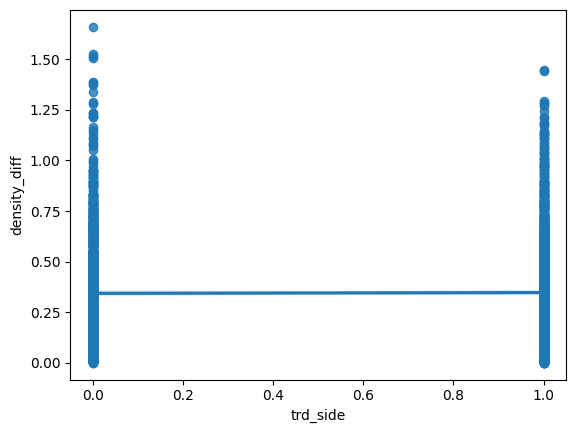

In [55]:
import seaborn as sns
sns.regplot(x=filtered_df['trd_side'], y=filtered_df['density_diff'])

In [8]:
df_data['diff_mid'] = df_data['mid_price'].diff(1).shift(1)

## labeling data

- label -1,0,1
- remove zeros for training
- train on selected cases when trade is worse than best order
- check model structure
- confusion matrix condition on gap between P_hat(Y,y=-1) and P_hat(Y,y=1) greater than alfa
- comparison with benchmark(()->{trade_prc<best_order;y_hat:=trd_side;0})

In [21]:
import pickle
df_data = pickle.load(open(r"C:\develop\EnergyTrading\Python\Strategies\Sparsity_strategy\ord_trd_data_jan-mar24.pkl", 'rb'))

In [131]:
df_data['b_bid_volume'].value_counts().values

array([839578, 642055, 138793,  96328,  40026,  13690,   6575,   3813,
         2351,   1452,   1388,    680,    482,    221,    165,     42,
           19,     10,     10,      8,      7,      4,      1,      1,
            1], dtype=int64)

In [144]:
import math
from Math.accumfeatures import EMA
win_sizes = [20, 30, 40, 50, 60, 70, 100]
label_dists = {}

for WINDOW_SIZE in win_sizes:
    df_copy = df_data.copy()
    for index, row in enumerate(df_copy.to_dict(orient='records')):
        if index+WINDOW_SIZE>=len(df_copy):
            break
        r_ema = EMA(WINDOW_SIZE//4)
        # calculate returns as mid differences
        returns_srs = pd.Series([df_copy.loc[i, 'mid_price'] \
                                  for i in range(index,index+WINDOW_SIZE)]).diff(1).shift(1).dropna().cumsum()
        (lambda :[r_ema.push(x) for x in returns_srs])() # push values to ema class anonym func
        label = 0
        y_ = r_ema.value/(row['ba_spread']+.0001)
        label = (lambda x: int(np.sign(x)*math.floor(abs(x))))(y_) # label {y>1: 1; y<-1: -1; 0}
        df_copy.loc[index, 'y'] = label
    df_copy.sample(10000)
    label_dists[WINDOW_SIZE] = df_copy['y'].value_counts()

KeyboardInterrupt: 

In [145]:
df_data.describe()

,timestamp,asks_density,bids_density,weighted_mid,price_movement,ba_spread,bid_price,ask_price,b_bid_volume,b_ask_volume,sb_bid_price,sb_bid_volume,sb_ask_price,sb_ask_volume,mid_price,trd_price,trd_side,last_trd_p
count,1787700,1.787700e+06,1.787700e+06,1.787700e+06,1.787700e+06,1.787700e+06,1.787700e+06,1.787700e+06,1.787700e+06,1.787700e+06,1.787700e+06,1.787700e+06,1.787700e+06,1.787700e+06,1.787700e+06,60910.000000,60910.000000,1.785271e+06
mean,2024-02-12 23:22:39.669491968,1.168830e-01,1.209697e-01,3.038682e-01,-1.114414e-02,1.264866e-01,6.582573e+01,6.595222e+01,1.921830e+00,1.998552e+00,6.579135e+01,2.045758e+00,6.598589e+01,2.028024e+00,6.588897e+01,65.430385,0.536743,6.589818e+01
min,2024-01-02 09:00:00,0.000000e+00,0.000000e+00,-6.445000e+00,-1.000000e+00,-7.800000e-01,5.320000e+01,5.327000e+01,1.000000e+00,1.000000e+00,5.307000e+01,1.000000e+00,5.328000e+01,1.000000e+00,5.324500e+01,53.200000,0.000000,5.320000e+01
25%,2024-01-23 15:18:44.750000128,7.000000e-02,7.000000e-02,2.222222e-01,-2.844444e-01,7.000000e-02,5.660000e+01,5.671000e+01,1.000000e+00,1.000000e+00,5.656000e+01,1.000000e+00,5.675000e+01,1.000000e+00,5.665000e+01,56.650000,0.000000,5.666000e+01
50%,2024-02-13 13:12:29.500000,1.000000e-01,1.000000e-01,3.015217e-01,-3.402778e-03,1.200000e-01,6.170000e+01,6.186000e+01,2.000000e+00,2.000000e+00,6.167000e+01,1.000000e+00,6.189000e+01,1.000000e+00,6.178000e+01,60.950000,1.000000,6.180000e+01
75%,2024-03-05 11:06:14.249999872,1.500000e-01,1.500000e-01,3.957143e-01,2.336111e-01,1.700000e-01,6.960000e+01,6.975000e+01,2.000000e+00,2.000000e+00,6.955000e+01,2.000000e+00,6.980000e+01,2.000000e+00,6.967500e+01,69.050000,1.000000,6.966000e+01
max,2024-03-25 17:24:59,1.390000e+00,2.630000e+00,1.046351e+00,1.000000e+00,1.560000e+00,9.819000e+01,9.825000e+01,4.900000e+01,5.000000e+01,9.818000e+01,3.400000e+01,9.830000e+01,4.900000e+01,9.819500e+01,98.200000,1.000000,9.820000e+01
std,NaN,6.619402e-02,7.197858e-02,1.986753e-01,4.685304e-01,7.474090e-02,1.156295e+01,1.158273e+01,1.441181e+00,1.500449e+00,1.155788e+01,1.769772e+00,1.158543e+01,1.728755e+00,1.157278e+01,11.496944,0.498652,1.157734e+01


## VPIN

In [32]:
from Math.ti_class import VPIN
import pandas as pd

In [11]:
v_cls = VPIN(20)
v_cls.soft_reset()

In [14]:
v_cls.push(57.5, 1)

(2, nan)

In [22]:
df_data.loc[df_data['trd_price'] > 0, 'trd_vol'] = np.random.randint(1,5)

In [41]:
# Assuming df_data is your DataFrame
data_p = df_data.dropna(subset=['trd_price']).set_index('timestamp')['trd_price']  # Extracting 'trd_price' column as a Series with 'timestamp' as index
data_v = df_data.dropna(subset=['trd_price']).set_index('timestamp')['trd_vol']     # Extracting 'trd_vol' column as a Series with 'timestamp' as index


In [42]:
data_p

timestamp
2024-01-02 09:00:01    91.97
2024-01-02 09:00:41    92.00
2024-01-02 09:00:51    91.96
2024-01-02 09:02:08    92.34
2024-01-02 09:02:48    92.50
                       ...  
2024-03-25 17:22:34    61.01
2024-03-25 17:23:22    61.23
2024-03-25 17:23:23    61.05
2024-03-25 17:23:35    61.00
2024-03-25 17:24:56    61.00
Name: trd_price, Length: 60910, dtype: float64

In [43]:
data_all = pd.concat([pd.Series(data_p), pd.Series(data_v)], axis=1)

In [47]:
data_all.values[0]

array([91.97,  1.  ])

In [44]:
v_cls.calc_vpin(data_all, 15)

TypeError: VPIN.push() missing 1 required positional argument: 'volume'